In [4]:
import datetime
print(datetime.datetime.now())

2019-11-20 22:27:58.213712


In [5]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

from sklearn.metrics import silhouette_score, silhouette_samples
import sklearn.metrics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture

import pandas_profiling

import itertools

import scipy

from yellowbrick.cluster import SilhouetteVisualizer, InterclusterDistance, KElbowVisualizer

from kmodes.kmodes import KModes

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# This will ensure that matplotlib figures don't get cut off when saving with savefig()
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

In [6]:
df = pd.read_csv("jewelry_customers.csv")

In [7]:
df.head()

,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130


In [8]:
list(df)
df.shape
df.info()
df.describe().transpose()
df.head(n=20)
df.tail()

['Age', 'Income', 'SpendingScore', 'Savings']

(505, 4)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 505 entries, 0 to 504
Data columns (total 4 columns):
Age              505 non-null int64
Income           505 non-null int64
SpendingScore    505 non-null float64
Savings          505 non-null float64
dtypes: float64(2), int64(2)
memory usage: 15.9 KB


,count,mean,std,min,25%,50%,75%,max
Age,505.0,59.019802,24.140043,17.0,34.000000,59.000000,85.000000,97.0
Income,505.0,75513.291089,35992.922184,12000.0,34529.000000,75078.000000,107100.000000,142000.0
SpendingScore,505.0,0.505083,0.259634,0.0,0.304792,0.368215,0.768279,1.0
Savings,505.0,11862.455867,4949.229253,0.0,6828.709702,14209.932802,16047.268331,20000.0


,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130
5,29,131578,0.847034,3535.514352
6,54,76500,0.785198,6878.884249
7,87,42592,0.355290,18086.287158
8,83,34384,0.324719,14783.379086
9,84,27693,0.367063,17879.558906


,Age,Income,SpendingScore,Savings
500,28,101206,0.387441,14936.775389
501,93,19934,0.203140,17969.693769
502,90,35297,0.355149,16091.401954
503,91,20681,0.354679,18401.088445
504,89,30267,0.289310,14386.351880


# Profile Data

In [9]:
pandas_profiling.ProfileReport(df, check_correlation=False)

C:\ProgramData\Anaconda3\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,4
Number of observations,505
Total Missing (%),0.0%
Total size in memory,15.9 KiB
Average record size in memory,32.3 B
Numeric,4
Categorical,0
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [10]:
X = df.copy()
X.head(10)

,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130
5,29,131578,0.847034,3535.514352
6,54,76500,0.785198,6878.884249
7,87,42592,0.355290,18086.287158
8,83,34384,0.324719,14783.379086
9,84,27693,0.367063,17879.558906


# Normalizing the Data

In [11]:
scaler = StandardScaler()
features = ['Age', 'Income','SpendingScore','Savings']
X[features] = scaler.fit_transform(X[features])

In [12]:
X.shape
X.info()
X.describe().transpose()
X.head(10)
X.tail()

(505, 4)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 505 entries, 0 to 504
Data columns (total 4 columns):
Age              505 non-null float64
Income           505 non-null float64
SpendingScore    505 non-null float64
Savings          505 non-null float64
dtypes: float64(4)
memory usage: 15.9 KB


,count,mean,std,min,25%,50%,75%,max
Age,505.0,5.672031e-17,1.000992,-1.742394,-1.037472,-0.000821,1.077295,1.574888
Income,505.0,-2.638154e-17,1.000992,-1.766355,-1.139805,-0.012106,0.878451,1.849048
SpendingScore,505.0,-1.954432e-16,1.000992,-1.947295,-0.772201,-0.527678,1.014725,1.908103
Savings,505.0,-4.058360e-16,1.000992,-2.399206,-1.018085,0.474782,0.846387,1.645835


,Age,Income,SpendingScore,Savings
0,-0.042287,0.062733,1.103593,-1.072467
1,-0.000821,0.174811,1.102641,-1.303473
2,0.123577,-0.021200,0.761727,-0.526556
3,-0.000821,-0.031712,1.004705,-0.913395
4,1.160228,-1.606165,-0.602619,1.012686
5,-1.244802,1.559204,1.318359,-1.684141
6,-0.208151,0.027441,1.079955,-1.007937
7,1.160228,-0.915567,-0.577512,1.258782
8,0.994363,-1.143838,-0.695375,0.590763
9,1.035829,-1.329920,-0.532121,1.216971


,Age,Income,SpendingScore,Savings
500,-1.286268,0.714535,-0.453557,0.621787
501,1.409024,-1.545704,-1.164109,1.235201
502,1.284626,-1.118447,-0.578054,0.855313
503,1.326092,-1.524929,-0.579866,1.322452
504,1.243160,-1.258335,-0.831890,0.510463


# Plot the Data

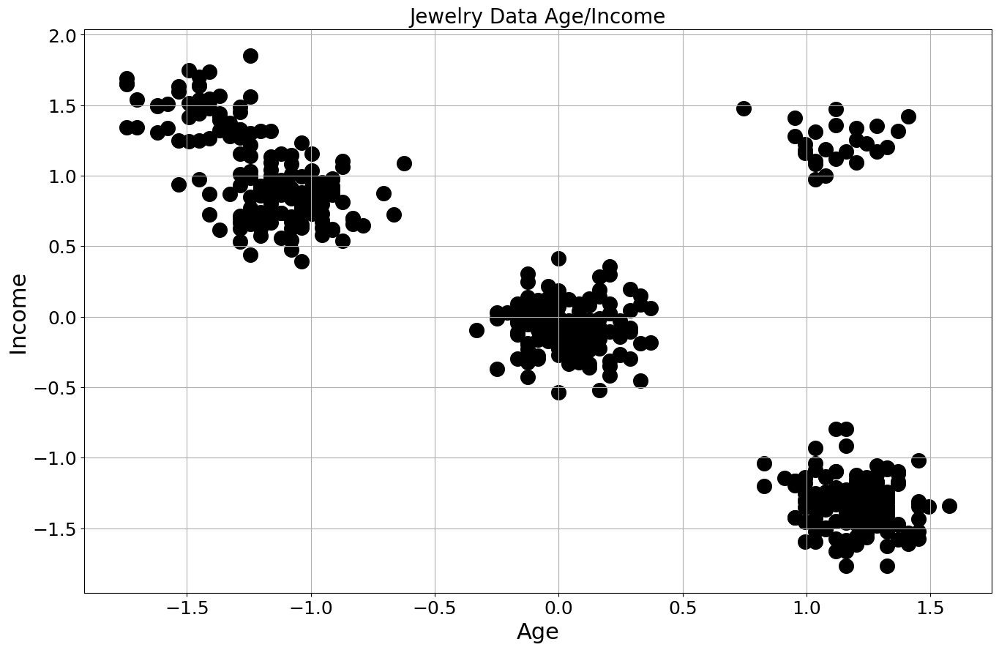

In [128]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c="black", s=200);
plt.title("Jewelry Data Age/Income", fontsize=20);
plt.xlabel('Age', fontsize=22);
plt.ylabel('Income', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

# Visualizing the Data

In [14]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

Text(0.5, 0, 'Age')

Text(0.5, 0, 'Income')

Text(0.5, 0, 'SpendingScore')

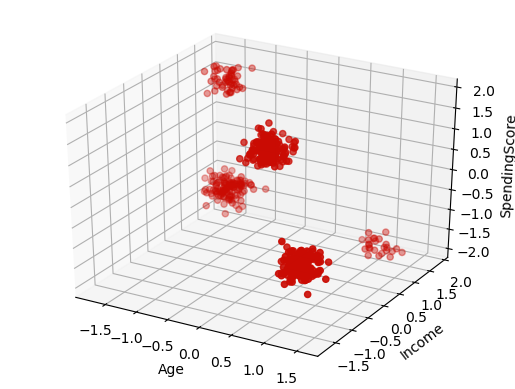

In [15]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = X.iloc[:, 0]
y = X.iloc[:, 1]
z = X.iloc[:, 2]

ax.scatter(x, y, z, c='r', marker='o')

ax.set_xlabel('Age')
ax.set_ylabel('Income')
ax.set_zlabel('SpendingScore')


plt.show()

plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 2], c="black", s=200);
plt.title("Jewelry Data Age/Income", fontsize=20);
plt.xlabel('Age (K)', fontsize=22);
plt.ylabel('SpendingScore', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

# K-Means

In [111]:
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=96)
k_means.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=96, tol=0.0001, verbose=0)

In [112]:
k_means.labels_

array([1, 1, 1, 1, 0, 3, 1, 0, 0, 0, 4, 2, 2, 2, 1, 4, 1, 0, 0, 4, 2, 4,
       1, 0, 4, 3, 3, 1, 0, 1, 1, 1, 0, 1, 2, 1, 0, 1, 2, 2, 1, 0, 3, 1,
       1, 3, 4, 3, 2, 1, 0, 2, 3, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 3, 3, 1, 1, 2, 0, 0, 2, 1, 2, 1, 1, 3, 1, 4, 1, 0, 0, 2, 2, 1,
       1, 1, 1, 1, 3, 0, 1, 3, 2, 1, 1, 2, 2, 3, 2, 3, 2, 0, 0, 2, 2, 1,
       0, 2, 1, 2, 2, 2, 1, 2, 3, 0, 2, 0, 0, 0, 2, 4, 1, 0, 1, 1, 2, 1,
       2, 1, 3, 0, 4, 3, 1, 2, 0, 1, 1, 3, 1, 3, 1, 4, 1, 0, 1, 2, 0, 1,
       0, 4, 2, 1, 0, 1, 2, 0, 1, 2, 0, 2, 0, 1, 2, 1, 0, 1, 2, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 2, 3, 3, 0, 2, 1, 1, 1, 2, 0, 1, 1, 1, 0, 3, 2,
       0, 0, 0, 2, 1, 2, 1, 2, 1, 0, 3, 1, 0, 0, 0, 0, 1, 0, 2, 3, 2, 0,
       1, 1, 2, 0, 2, 3, 2, 1, 1, 0, 1, 1, 0, 1, 1, 1, 2, 1, 2, 2, 3, 1,
       1, 1, 4, 1, 2, 0, 3, 3, 3, 0, 1, 2, 0, 0, 2, 2, 1, 1, 4, 1, 1, 0,
       1, 0, 2, 3, 1, 2, 0, 1, 0, 0, 2, 1, 0, 0, 1, 1, 0, 2, 2, 4, 2, 0,
       0, 2, 4, 0, 0, 3, 1, 2, 2, 1, 2, 0, 0, 2, 1,

In [113]:
k_means.cluster_centers_

array([[ 1.19238486, -1.32510593, -0.67963841,  0.97016358],
       [ 0.03879611, -0.08524639,  1.02721559, -1.00569483],
       [-1.08815238,  0.82744102, -0.75240648,  0.6270464 ],
       [-1.44466803,  1.46050665,  1.51057952, -1.57249636],
       [ 1.11876151,  1.23565419, -1.68367042,  0.59588052]])

# Plot Clusters

<Figure size 1600x1000 with 0 Axes>

Text(0.5, 1.0, 'K-Means (K=5)')

Text(0.5, 0, 'Age')

Text(0, 0.5, 'Income')

(array([-2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ]),
 <a list of 9 Text xticklabel objects>)

(array([-2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,  2.5]),
 <a list of 10 Text yticklabel objects>)

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1187615097372667, 1.235654192369486, '4')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(0.038796109994652286, -0.08524639295632358, '1')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(-1.4446680277775004, 1.4605066479893327, '3')

Text(-1.0881523772996013, 0.8274410186315021, '2')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

Text(1.1923848565716506, -1.3251059310349, '0')

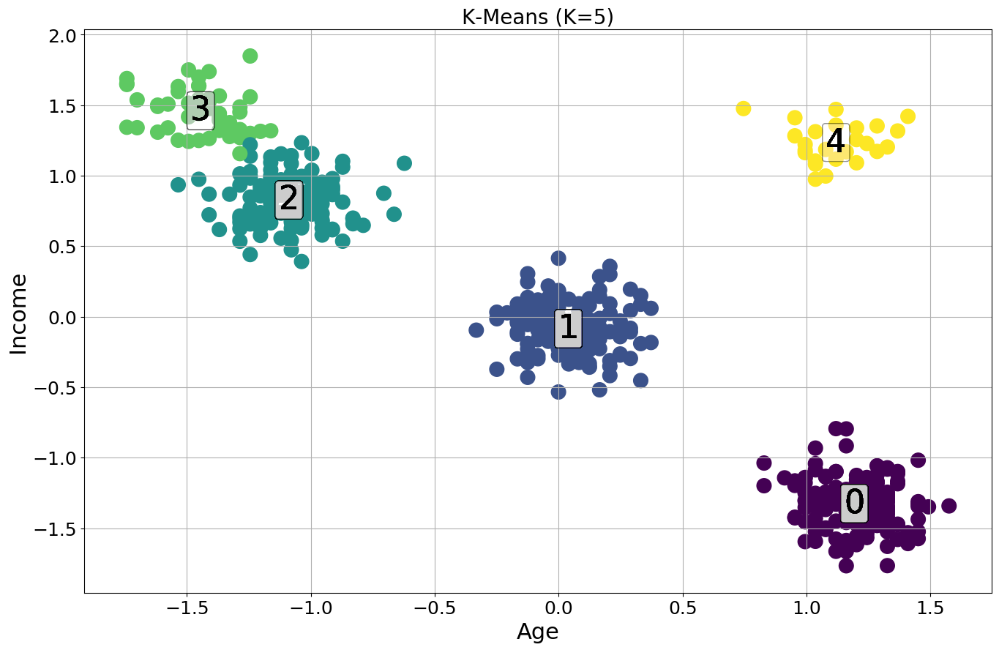

In [114]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

sc = plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=k_means.labels_);
#plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")
plt.title("K-Means (K=5)", fontsize=20);
plt.xlabel('Age', fontsize=22);
plt.ylabel('Income', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

for label in k_means.labels_:
    plt.text(x=k_means.cluster_centers_[label, 0], y=k_means.cluster_centers_[label, 1], s=label, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.02));

# Internal Validation Metrics

In [115]:
# WCSS == Inertia
k_means.inertia_

66.5111137485908

In [116]:
silhouette_score(X, k_means.labels_)

0.8048976287755765

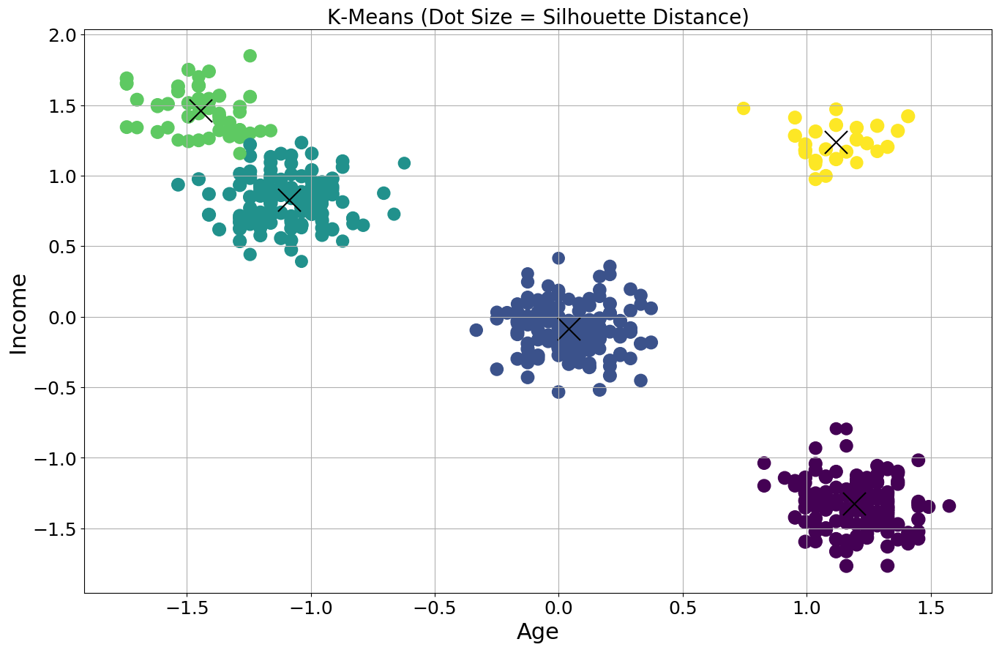

In [117]:
plt.style.use('default');

sample_silhouette_values = silhouette_samples(X, k_means.labels_)
sizes = 200*sample_silhouette_values

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=sizes, c=k_means.labels_)
plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

plt.title("K-Means (Dot Size = Silhouette Distance)", fontsize=20);
plt.xlabel('Age', fontsize=22);
plt.ylabel('Income', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

#plt.savefig('out/mall-kmeans-5-silhouette-size.png');

SilhouetteVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x0000019F722FA448>,
                     colors=None, is_fitted='auto', model=None)

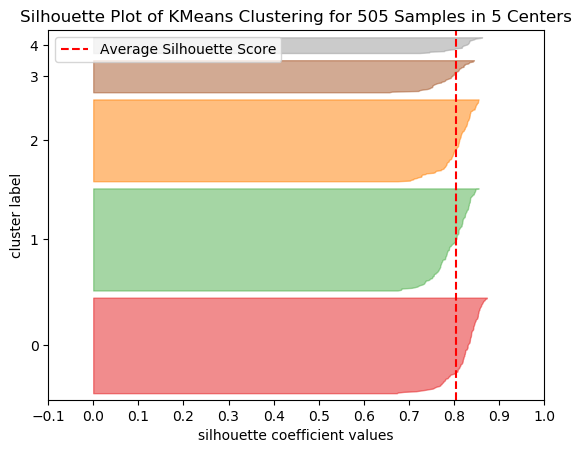

In [118]:
visualizer = SilhouetteVisualizer(k_means)
visualizer.fit(X)
visualizer.poof()
fig = visualizer.ax.get_figure()
#fig.savefig('out/mall-kmeans-5-silhouette.png', transparent=False);

## Elbow Method (Manual)

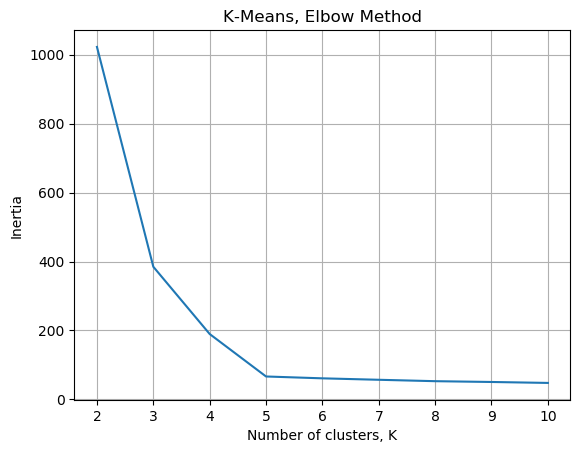

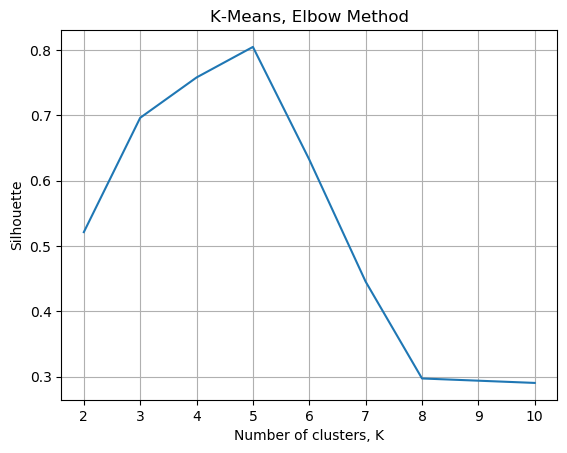

In [119]:
inertias = {}
silhouettes = {}
for k in range(2, 11):
    kmeans = KMeans(init='k-means++', n_init=10, n_clusters=k, max_iter=1000, random_state=42).fit(X)
    inertias[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    silhouettes[k] = silhouette_score(X, kmeans.labels_, metric='euclidean')
    

plt.figure();
plt.grid(True);
plt.plot(list(inertias.keys()), list(inertias.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Inertia");
#plt.savefig('out/mall-kmeans-elbow-interia.png');


plt.figure();
plt.grid(True);
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Silhouette");
#plt.savefig('out/mall-kmeans-elbow-silhouette.png');

## Elbow Method (Using Yellowbrick Package)

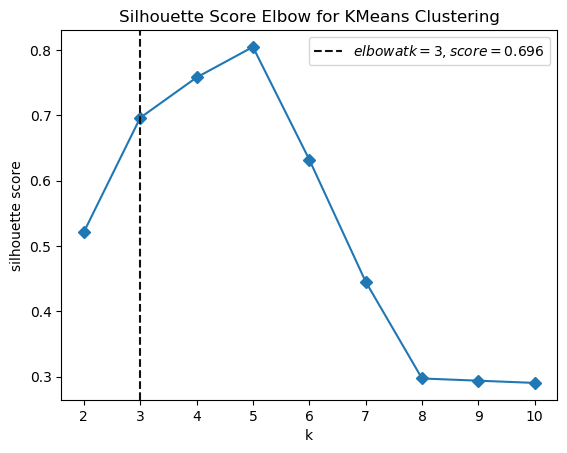

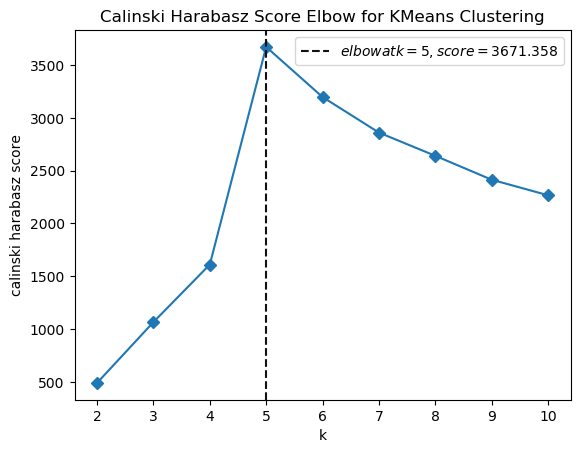

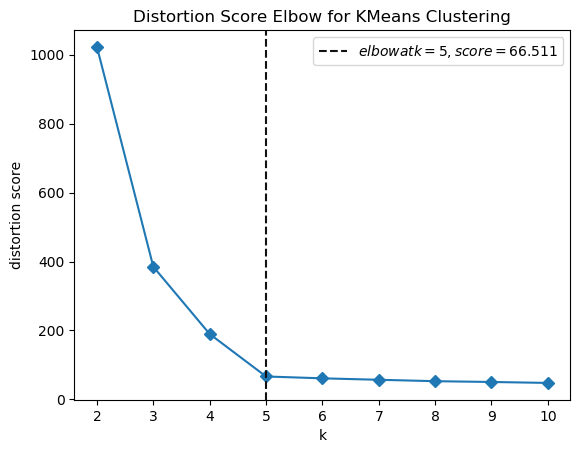

In [120]:
model = KMeans(init='k-means++', n_init=10, max_iter=1000, random_state=42)
KElbowVisualizer(model, k=(2,11), metric='silhouette', timings=False).fit(X).poof();
KElbowVisualizer(model, k=(2,11), metric='calinski_harabasz', timings=False).fit(X).poof();
KElbowVisualizer(model, k=(2,11), metric='distortion', timings=False).fit(X).poof();

## Intepretting the Clusters

In [121]:
k_means.cluster_centers_

array([[ 1.19238486, -1.32510593, -0.67963841,  0.97016358],
       [ 0.03879611, -0.08524639,  1.02721559, -1.00569483],
       [-1.08815238,  0.82744102, -0.75240648,  0.6270464 ],
       [-1.44466803,  1.46050665,  1.51057952, -1.57249636],
       [ 1.11876151,  1.23565419, -1.68367042,  0.59588052]])

In [122]:
for label in set(k_means.labels_):
    print('\nCluster {}:'.format(label))
    X_tmp = X[k_means.labels_==label].copy()
    X_tmp.loc['mean'] = X_tmp.mean()
    X_tmp.tail(13)


Cluster 0:


,Age,Income,SpendingScore,Savings
485,1.284626,-1.466499,-0.573590,0.821470
486,1.326092,-1.316793,-0.776438,1.132151
488,1.367558,-1.579355,-0.683255,0.703620
489,1.574888,-1.341656,-0.852659,0.620046
490,1.035829,-1.086019,-0.583946,0.950770
493,1.367558,-1.098006,-0.648148,1.109584
494,1.160228,-1.268291,-0.628164,1.270098
497,1.326092,-1.244736,-0.776418,0.734084
501,1.409024,-1.545704,-1.164109,1.235201
502,1.284626,-1.118447,-0.578054,0.855313



Cluster 1:


,Age,Income,SpendingScore,Savings
467,0.082111,-0.096957,0.991771,-0.998383
469,0.165043,-0.137199,1.007903,-0.930429
470,-0.042287,-0.134529,0.998339,-0.849062
472,0.123577,-0.051124,1.123989,-1.450915
473,0.040645,-0.334767,0.951579,-0.873509
474,0.123577,-0.216432,1.210931,-1.194480
478,0.247975,-0.141370,0.739895,-0.989273
479,-0.000821,-0.169793,1.445093,-1.086232
480,0.247975,-0.119150,1.090334,-0.574015
491,-0.042287,-0.143067,1.539992,-0.890089



Cluster 2:


,Age,Income,SpendingScore,Savings
454,-1.161870,0.901590,-0.504442,0.069791
457,-0.996006,0.962051,-0.841685,0.619312
460,-1.286268,0.697459,-0.946440,0.739818
461,-1.078938,1.143099,-0.709982,0.655710
463,-1.286268,0.535322,-0.776811,0.705873
468,-1.120404,1.155169,-0.746896,0.495131
471,-1.161870,0.714618,-0.774009,1.022407
476,-1.078938,0.868912,-0.951075,0.519625
477,-1.078938,0.878451,-0.627070,0.613434
482,-1.120404,0.915078,-0.839366,0.977675



Cluster 3:


,Age,Income,SpendingScore,Savings
406,-1.410666,1.263825,1.436486,-1.268526
412,-1.576530,1.507698,1.722243,-1.478797
415,-1.369200,1.394675,1.625959,-1.167596
442,-1.742394,1.689275,1.660880,-1.564668
445,-1.452132,1.250143,1.551423,-1.420640
451,-1.327734,1.311493,1.561530,-1.548476
456,-1.742394,1.343670,1.684540,-1.630882
458,-1.286268,1.451326,1.450948,-1.288677
466,-1.700928,1.340611,1.162288,-1.505162
487,-1.369200,1.320782,1.848446,-1.515115



Cluster 4:


,Age,Income,SpendingScore,Savings
283,1.284626,1.353181,-1.828737,0.588746
288,0.994363,1.163428,-1.347032,0.652110
311,1.077295,1.186289,-1.472325,0.605440
312,1.201694,1.091677,-1.823122,1.207573
343,1.035829,1.104748,-1.682128,0.512529
351,1.326092,1.203671,-1.873225,0.441907
353,0.745567,1.476272,-1.789902,0.534138
368,1.035829,0.975288,-1.642530,0.622034
383,1.160228,1.169463,-1.452726,0.432373
414,1.201694,1.338748,-1.835384,0.332122


# Examplers 

In [123]:
from scipy.spatial import distance

for i, label in enumerate(set(k_means.labels_)):    
    X_tmp = X[k_means.labels_==label].copy()
    
    exemplar_idx = distance.cdist([k_means.cluster_centers_[i]], X_tmp).argmin()
    exemplar = pd.DataFrame(X_tmp.iloc[exemplar_idx])
   
    print('\nCluster {}:'.format(label))
    exemplar


Cluster 0:


,335
Age,1.243160
Income,-1.350862
SpendingScore,-0.690416
Savings,0.949109



Cluster 1:


,467
Age,0.082111
Income,-0.096957
SpendingScore,0.991771
Savings,-0.998383



Cluster 2:


,405
Age,-1.037472
Income,0.770100
SpendingScore,-0.786483
Savings,0.664874



Cluster 3:


,95
Age,-1.410666
Income,1.541294
SpendingScore,1.575637
Savings,-1.601849



Cluster 4:


,155
Age,1.118762
Income,1.117318
SpendingScore,-1.724288
Savings,0.594762


In [124]:
#5 Clusters
print (df.iloc[405],
      df.iloc[467],
      df.iloc[335],
      df.iloc[95],
      df.iloc[155])

Age                  34.000000
Income           103204.000000
SpendingScore         0.301087
Savings           15149.810421
Name: 405, dtype: float64 Age                 61.000000
Income           72027.000000
SpendingScore        0.762325
Savings           6926.123598
Name: 467, dtype: float64 Age                 89.000000
Income           26940.000000
SpendingScore        0.326005
Savings          16555.159377
Name: 335, dtype: float64 Age                  25.000000
Income           130934.000000
SpendingScore         0.913766
Savings            3942.389134
Name: 95, dtype: float64 Age                  86.000000
Income           115689.000000
SpendingScore         0.057843
Savings           14803.153273
Name: 155, dtype: float64


In [125]:
# 4 Clusters
print (df.iloc[269],
      df.iloc[467],
      df.iloc[335],
      df.iloc[95],
)

Age                  37.000000
Income           106664.000000
SpendingScore         0.277587
Savings           14479.374117
Name: 269, dtype: float64 Age                 61.000000
Income           72027.000000
SpendingScore        0.762325
Savings           6926.123598
Name: 467, dtype: float64 Age                 89.000000
Income           26940.000000
SpendingScore        0.326005
Savings          16555.159377
Name: 335, dtype: float64 Age                  25.000000
Income           130934.000000
SpendingScore         0.913766
Savings            3942.389134
Name: 95, dtype: float64


In [126]:
# Three Clusters
print (df.iloc[335],
      df.iloc[142],
      df.iloc[269],
      )

Age                 89.000000
Income           26940.000000
SpendingScore        0.326005
Savings          16555.159377
Name: 335, dtype: float64 Age                 56.000000
Income           84386.000000
SpendingScore        0.784945
Savings           7270.419534
Name: 142, dtype: float64 Age                  37.000000
Income           106664.000000
SpendingScore         0.277587
Savings           14479.374117
Name: 269, dtype: float64


# Relative Importance

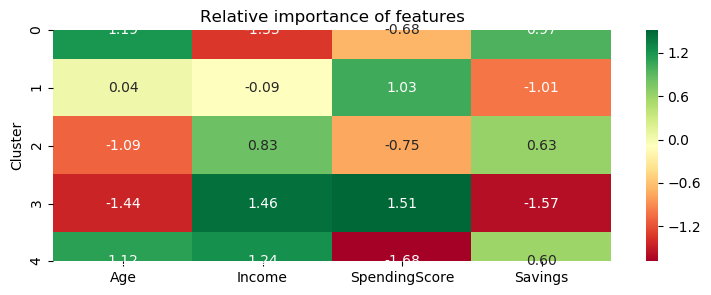

In [127]:
dat = X.copy()

dat['Cluster'] = k_means.labels_

cluster_avg = dat.groupby(['Cluster']).mean()
population_avg = dat.drop(['Cluster'], axis=1).mean()

relative_imp = cluster_avg - population_avg

plt.figure(figsize=(9, 3));
plt.title('Relative importance of features');
sns.heatmap(data=relative_imp, annot=True, fmt='.2f', cmap='RdYlGn');
#plt.savefig('out/mall-kmeans-5-importance.png', transparent=False);

# Lots of K's

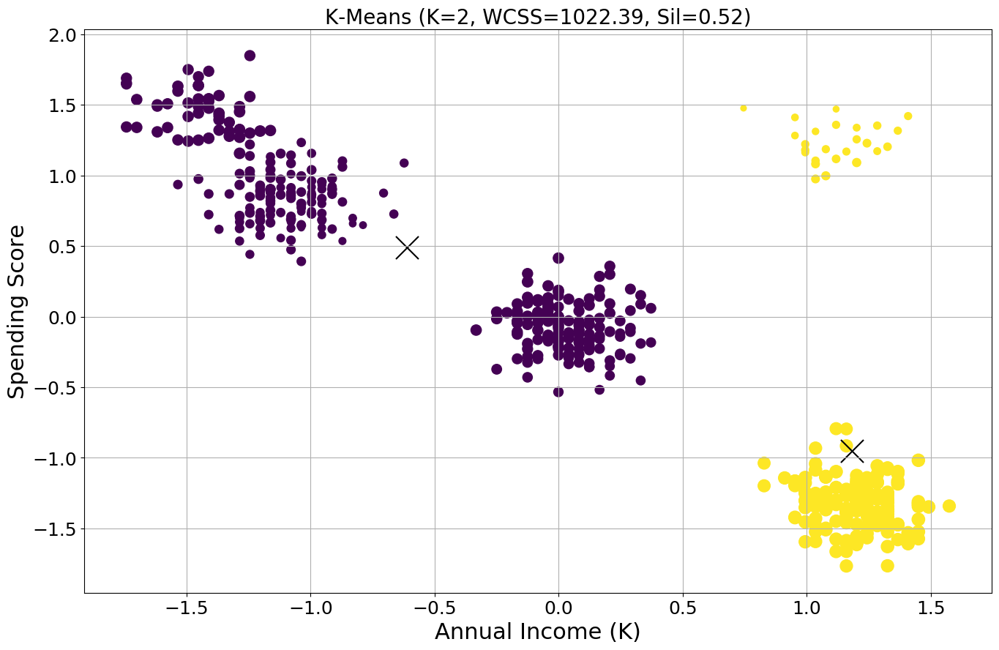

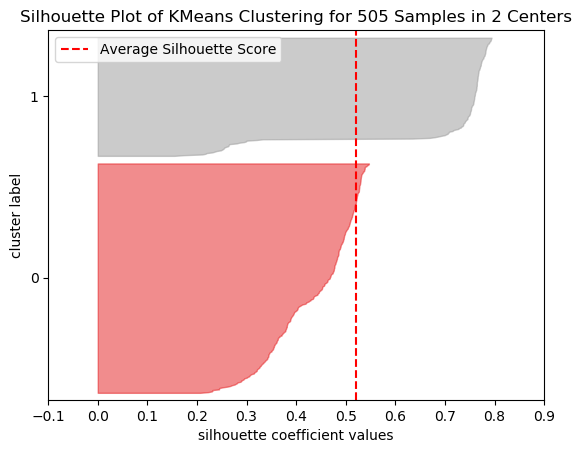

K=2, WCSS=1022.39, Sil=0.52


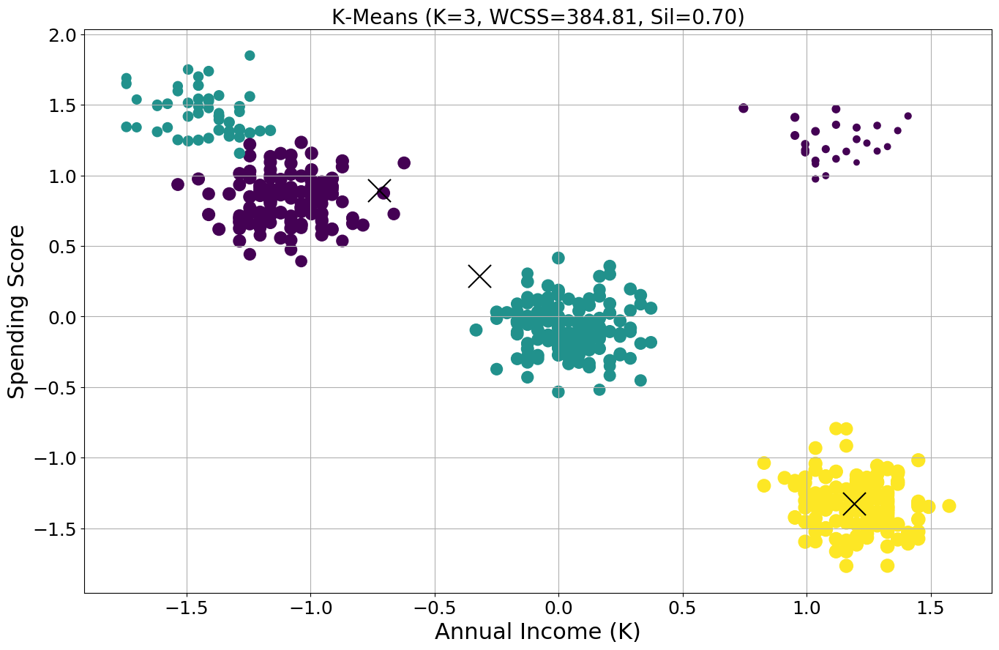

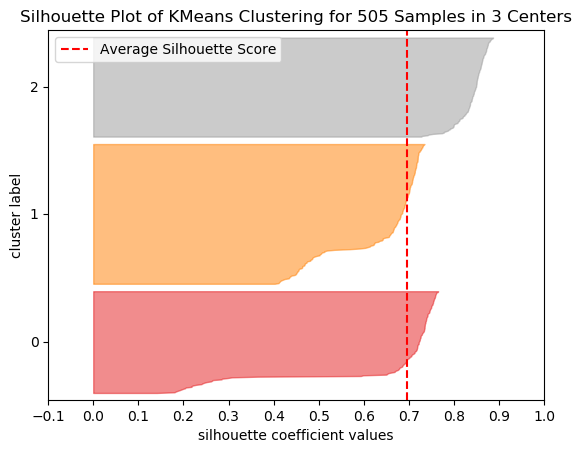

K=3, WCSS=384.81, Sil=0.70


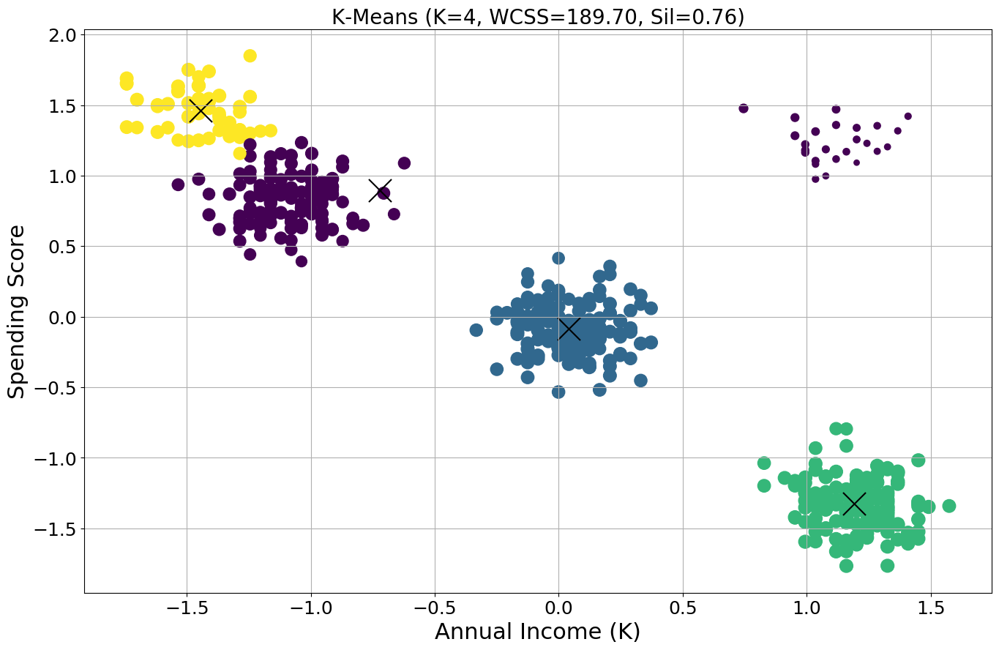

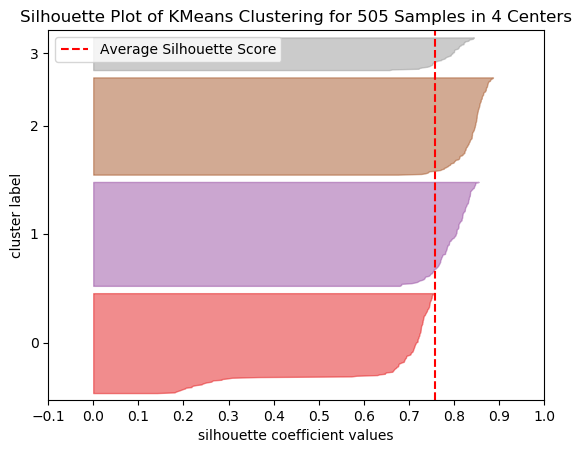

K=4, WCSS=189.70, Sil=0.76


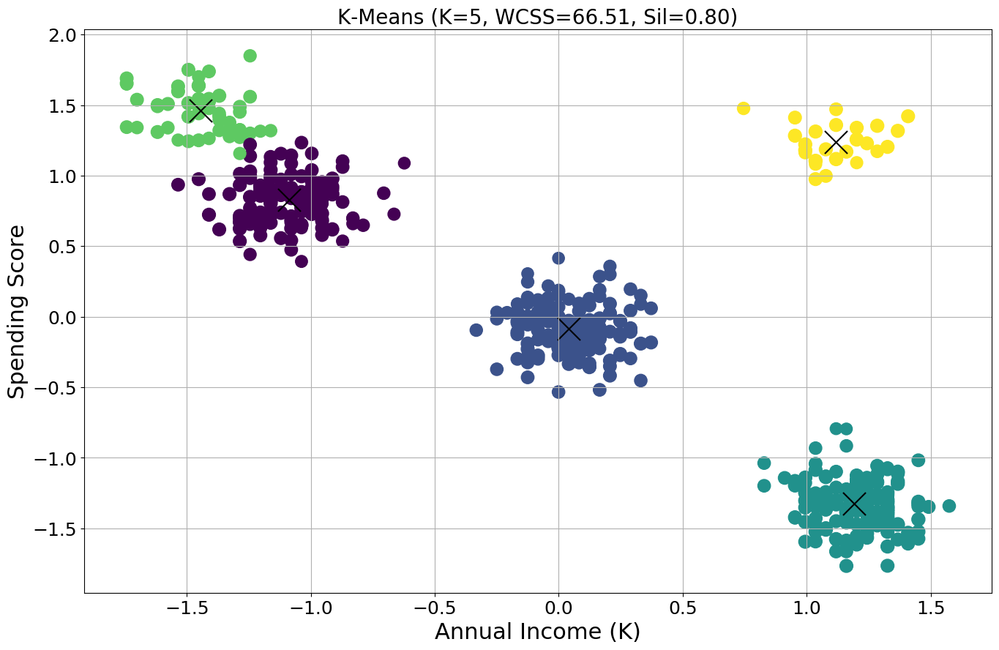

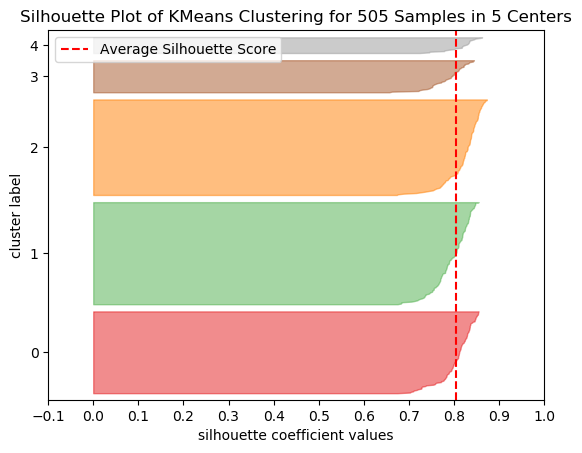

K=5, WCSS=66.51, Sil=0.80


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


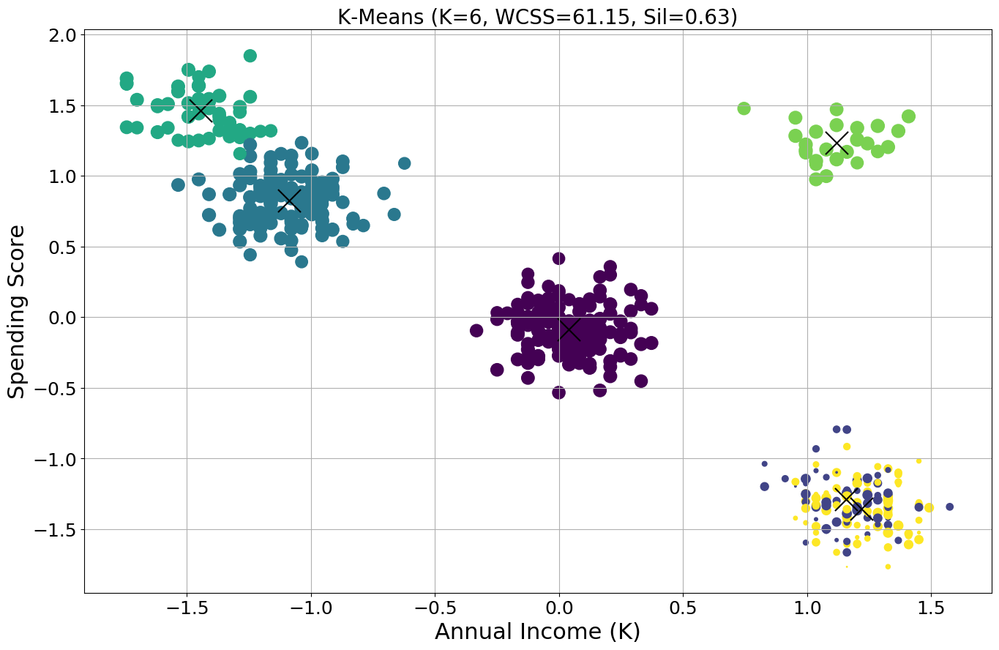

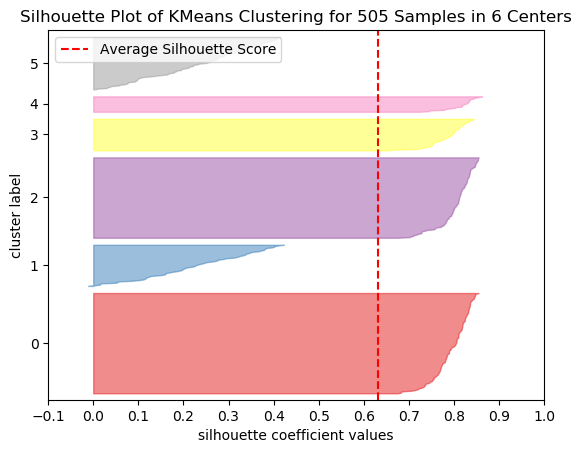

K=6, WCSS=61.15, Sil=0.63


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


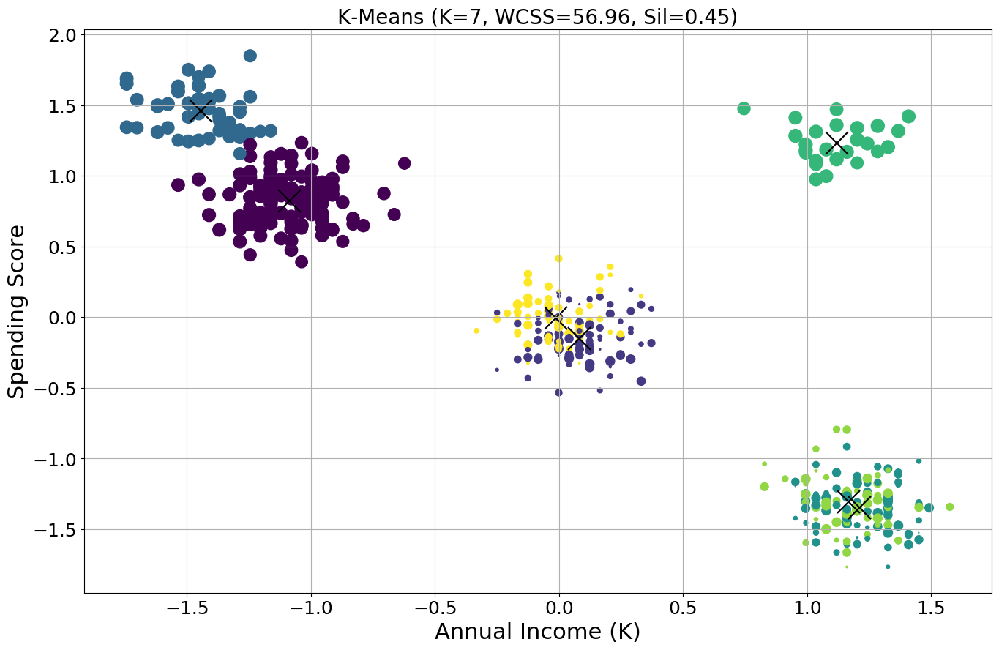

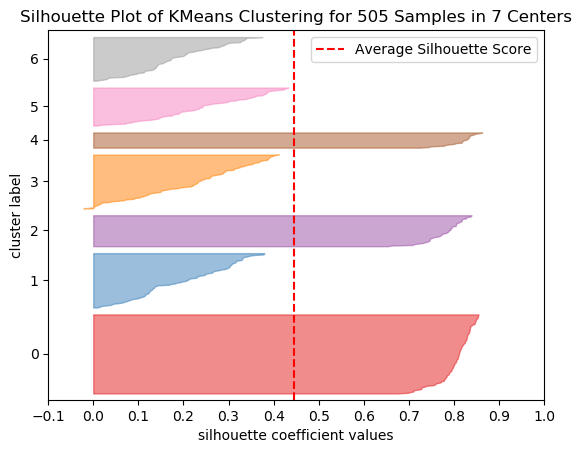

K=7, WCSS=56.96, Sil=0.45


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


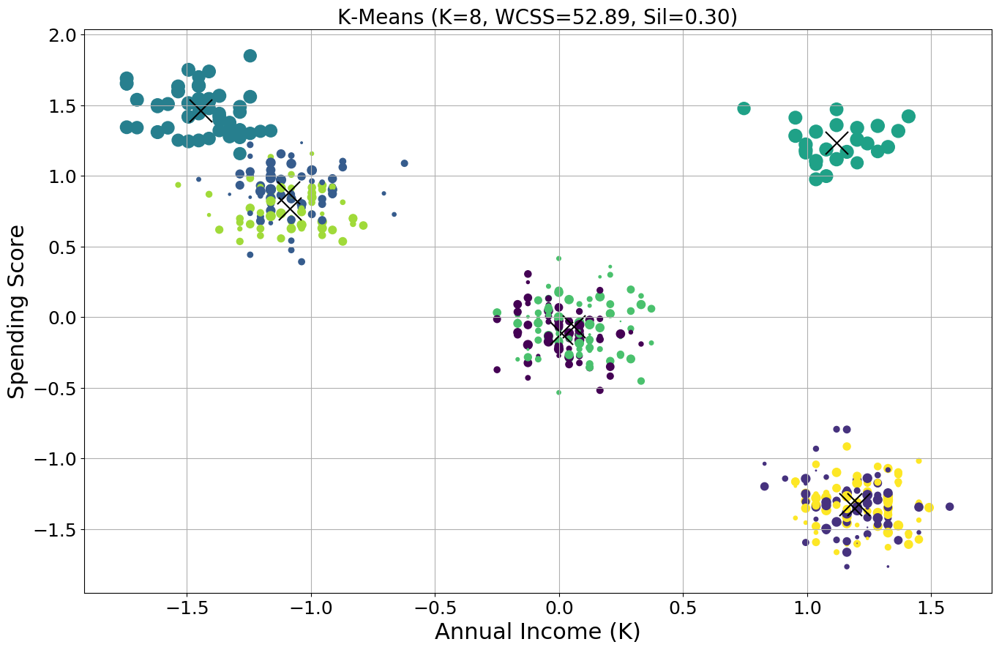

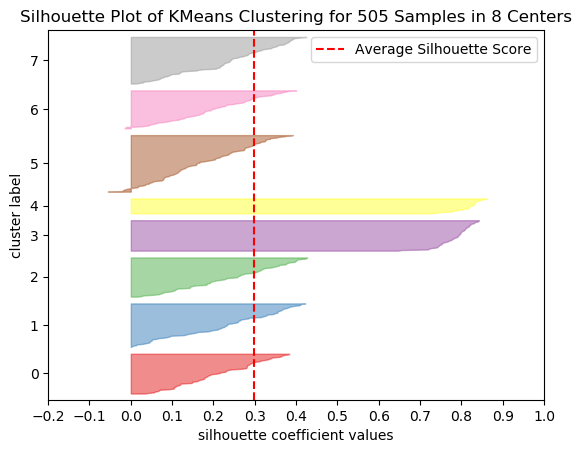

K=8, WCSS=52.89, Sil=0.30


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


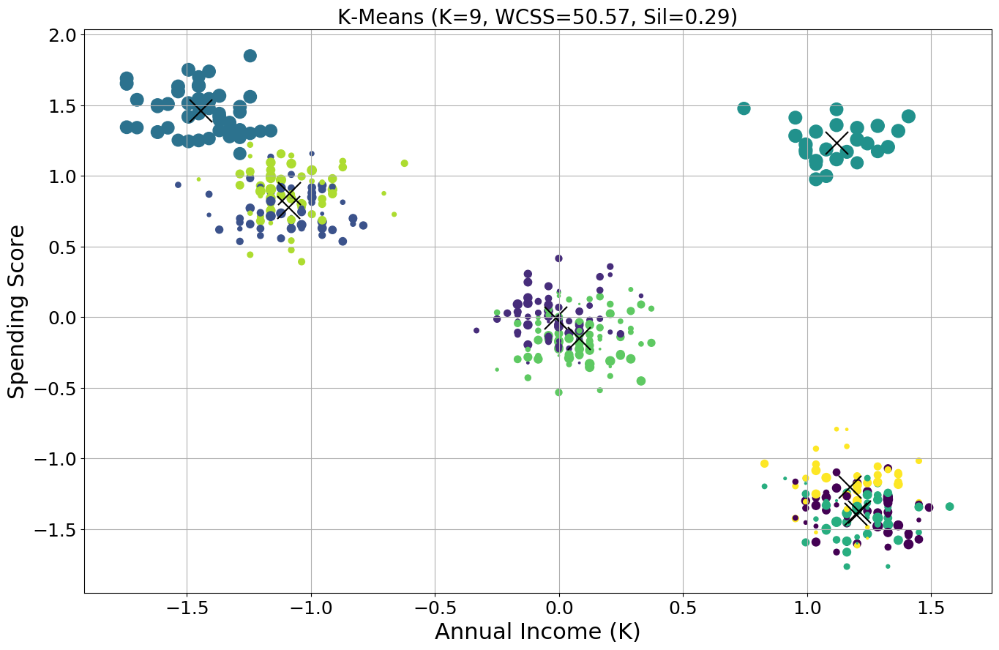

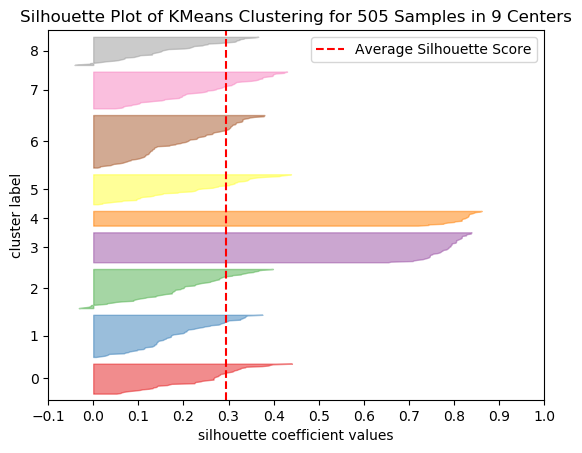

K=9, WCSS=50.57, Sil=0.29


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


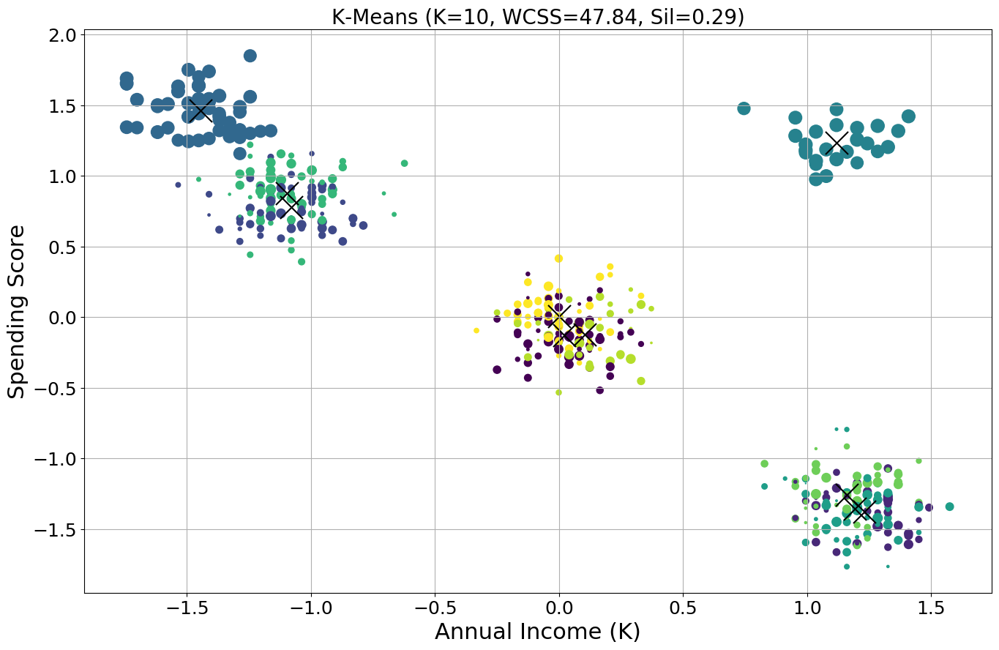

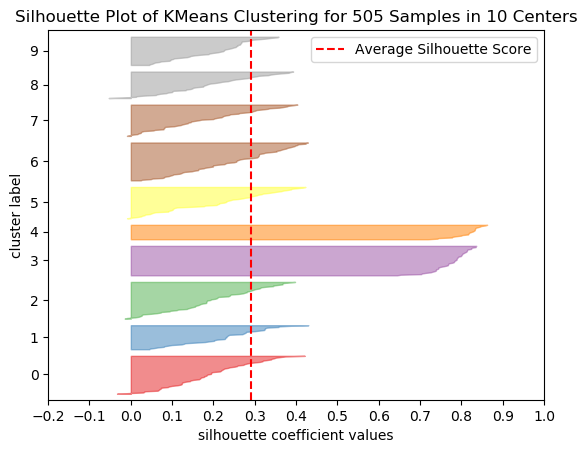

K=10, WCSS=47.84, Sil=0.29


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


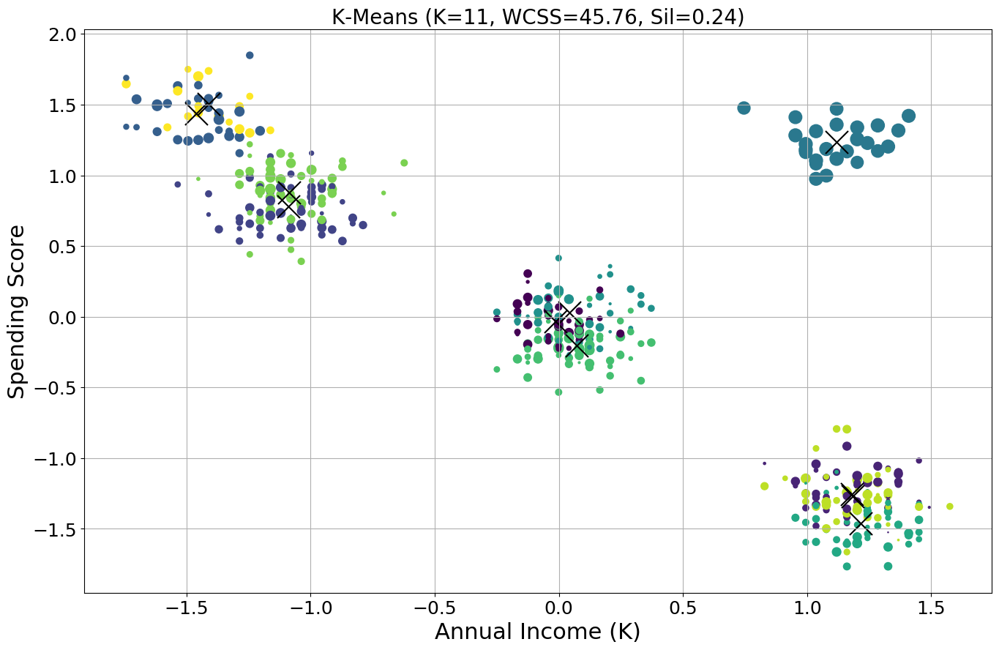

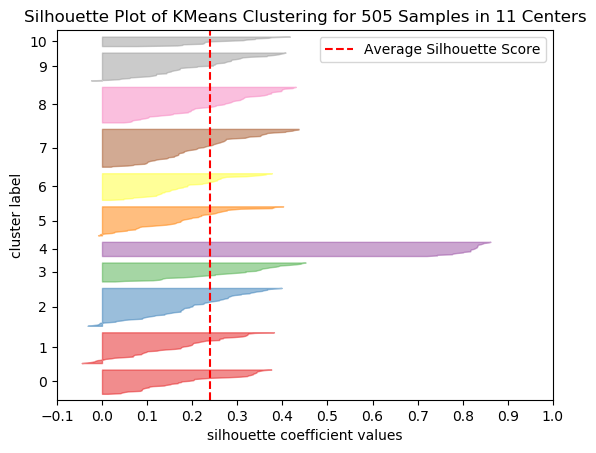

K=11, WCSS=45.76, Sil=0.24


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


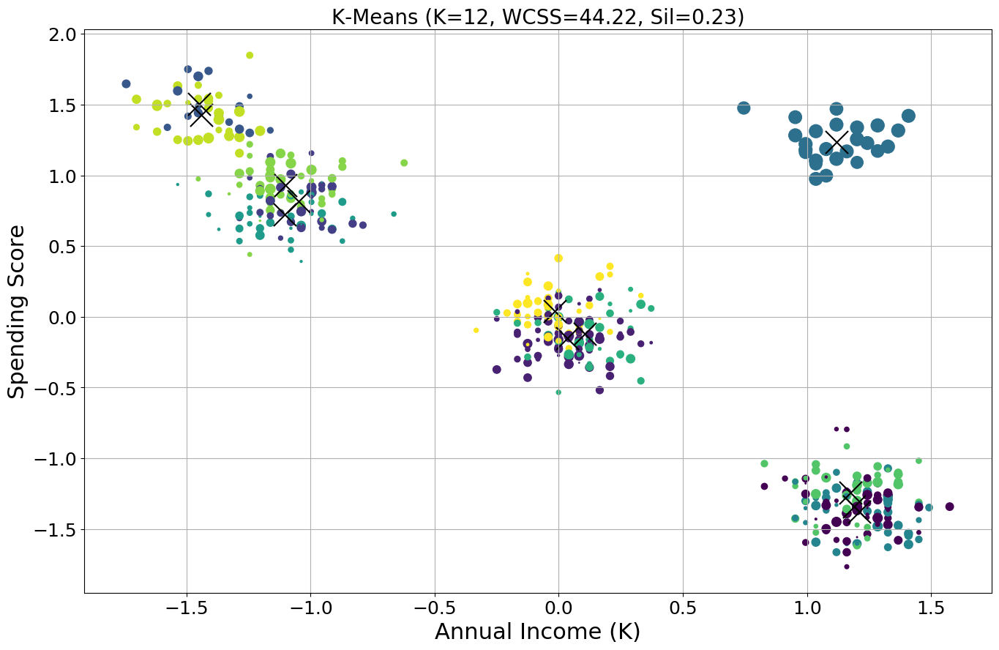

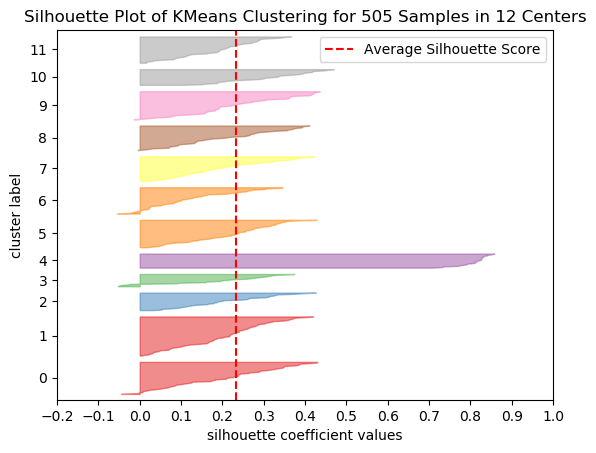

K=12, WCSS=44.22, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


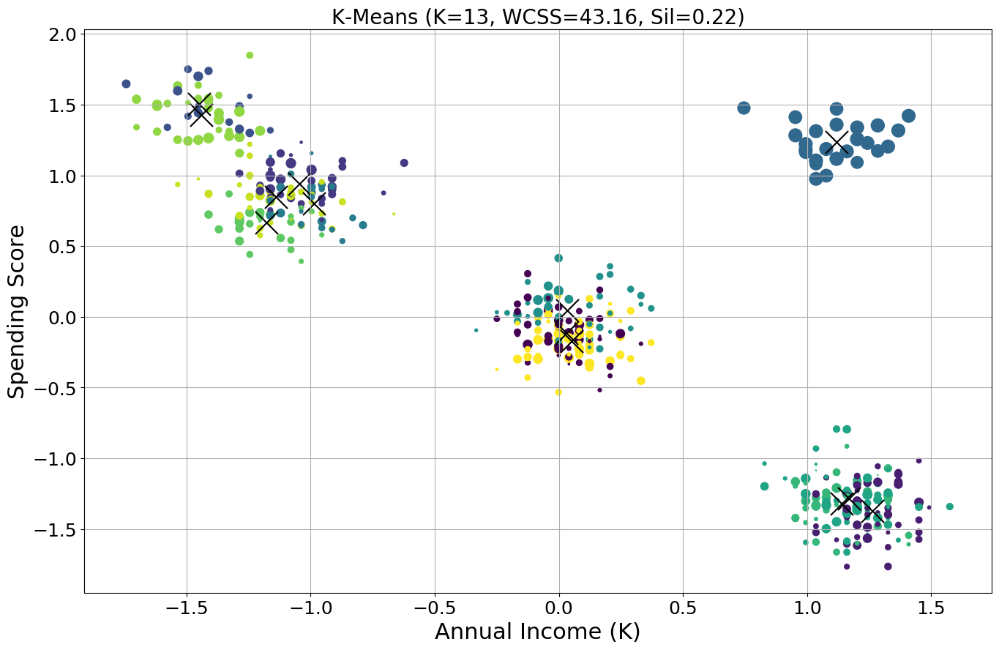

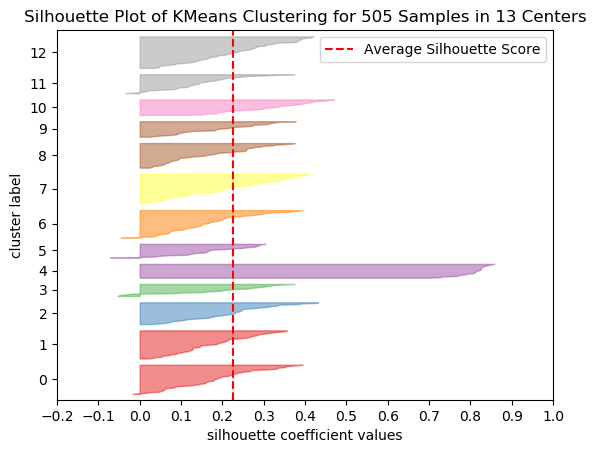

K=13, WCSS=43.16, Sil=0.22


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


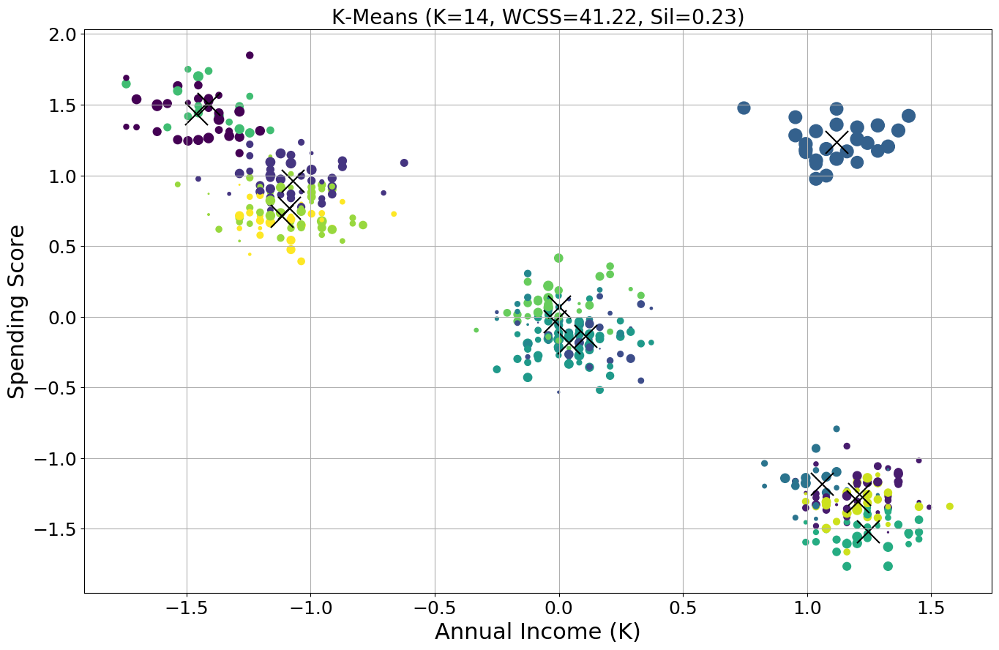

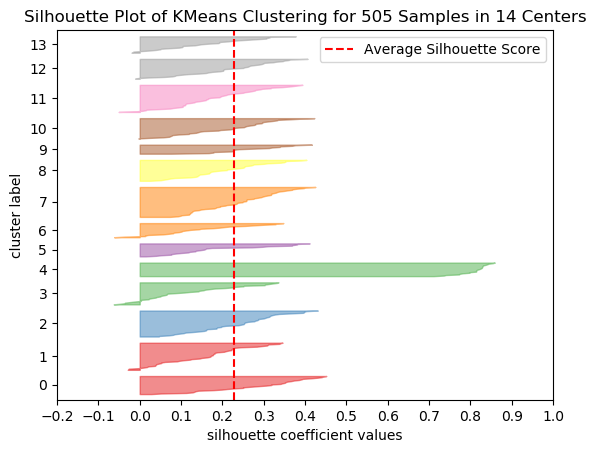

K=14, WCSS=41.22, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


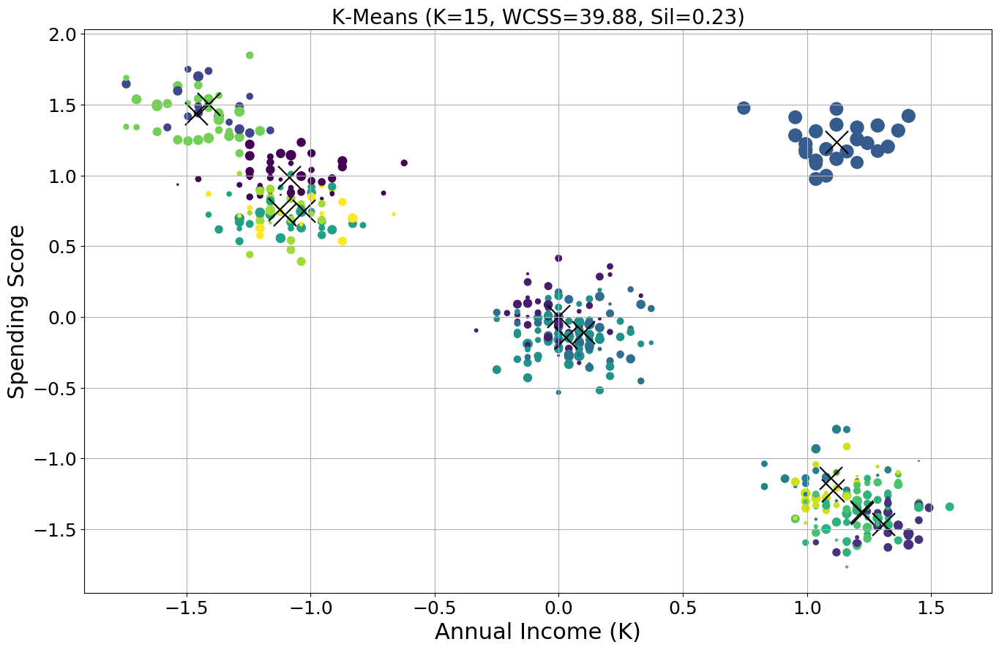

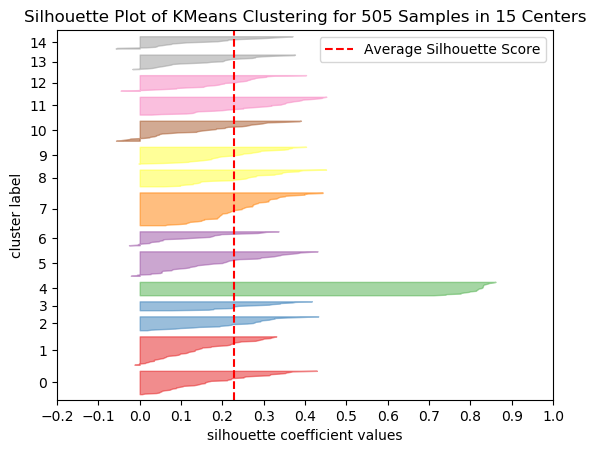

K=15, WCSS=39.88, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


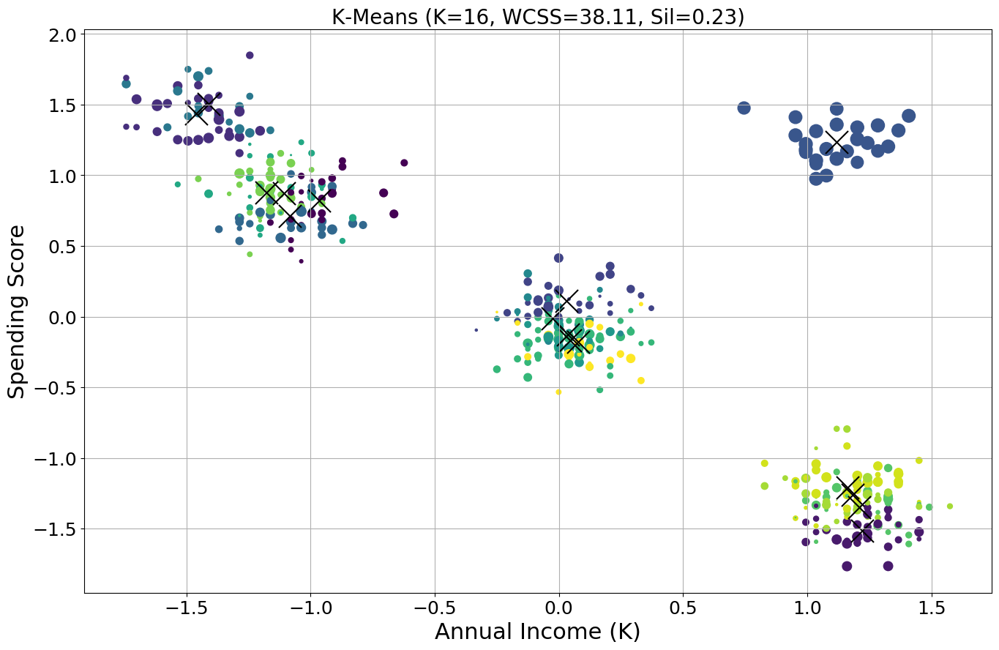

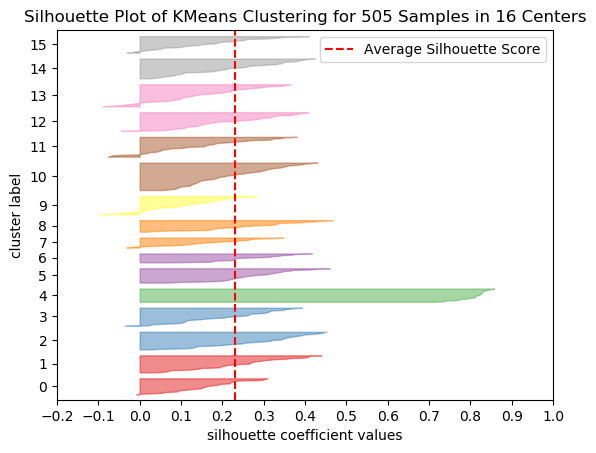

K=16, WCSS=38.11, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


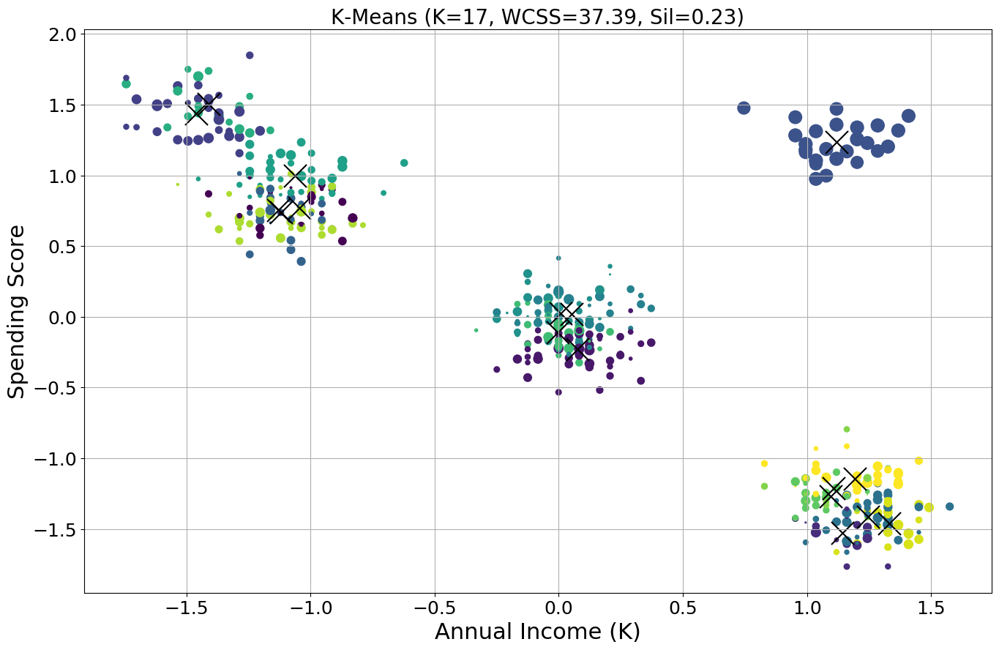

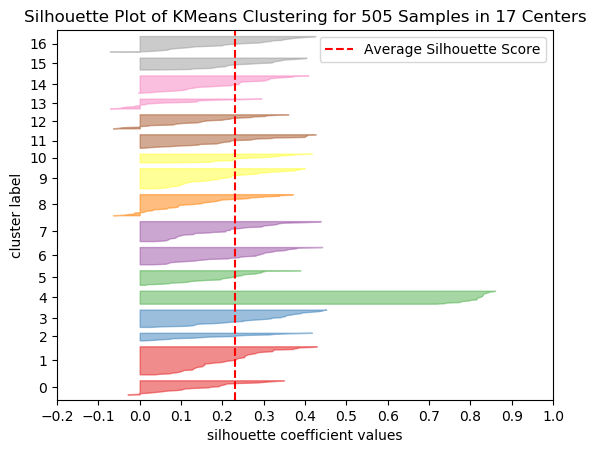

K=17, WCSS=37.39, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


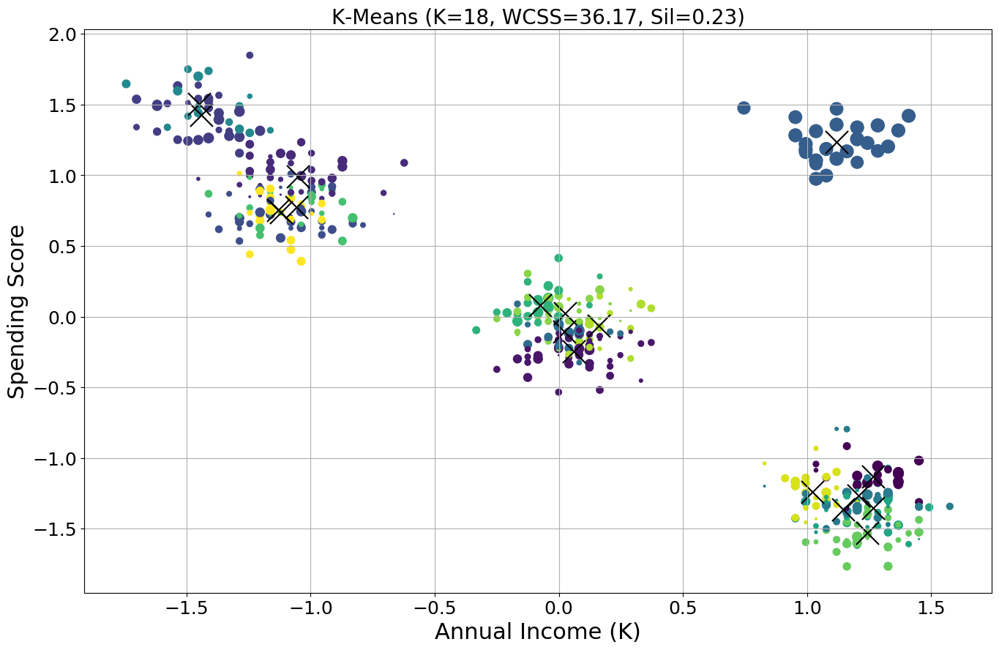

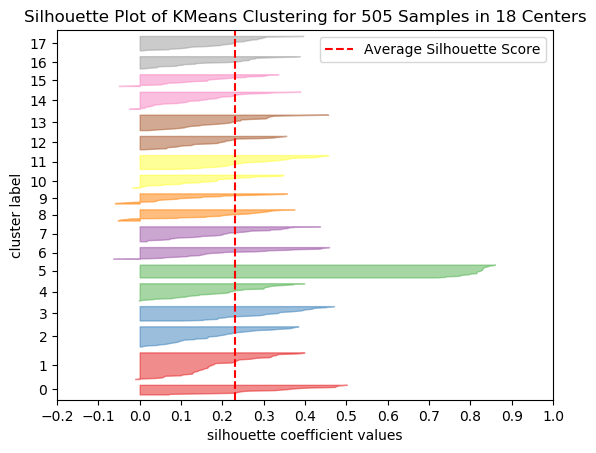

K=18, WCSS=36.17, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


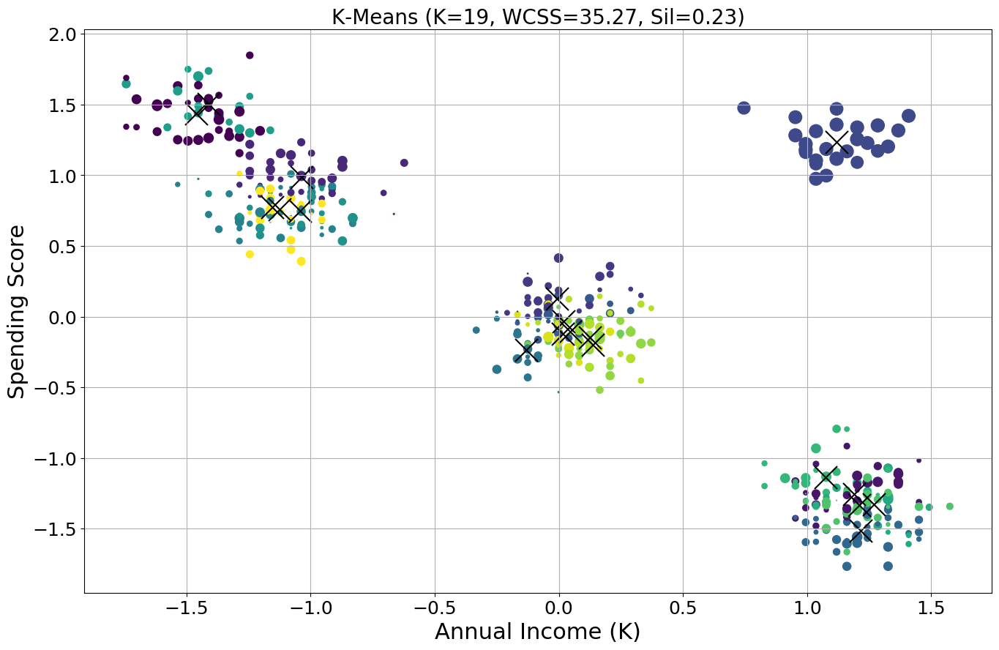

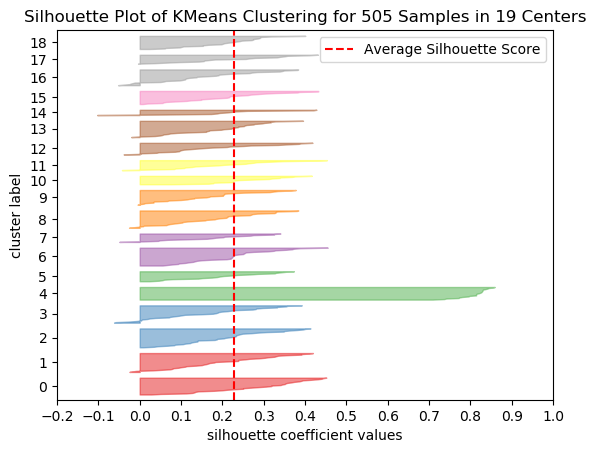

K=19, WCSS=35.27, Sil=0.23


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


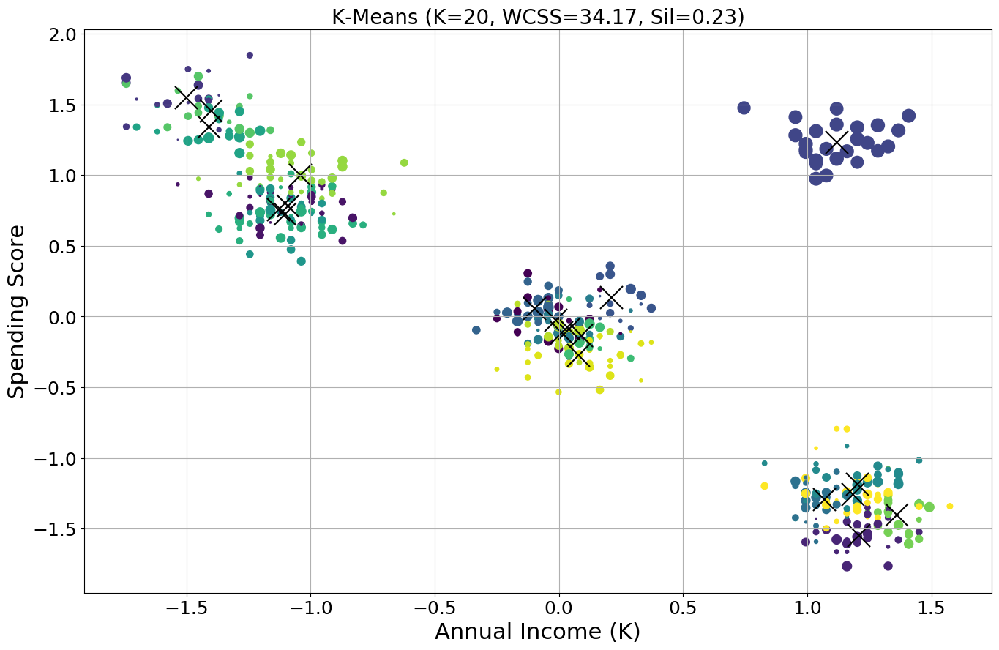

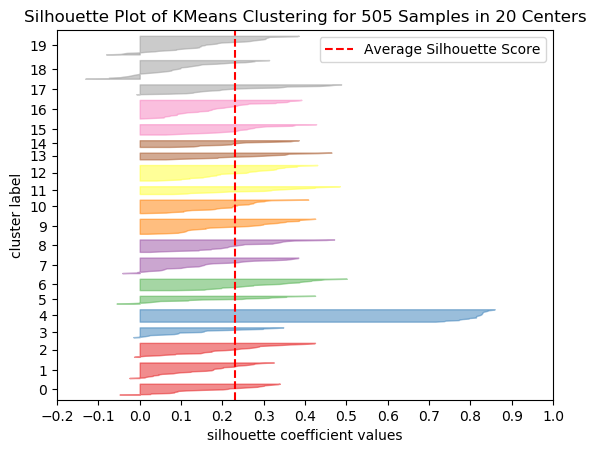

K=20, WCSS=34.17, Sil=0.23


In [45]:
def do_kmeans(X, k):
    k_means = KMeans(init='k-means++', n_clusters=k, n_init=10, random_state=42)
    k_means.fit(X)
    wcss = k_means.inertia_
    sil = silhouette_score(X, k_means.labels_)
    
    plt.style.use('default');

    sample_silhouette_values = silhouette_samples(X, k_means.labels_)
    sizes = 200*sample_silhouette_values

    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=sizes, c=k_means.labels_)
    plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

    plt.title("K-Means (K={}, WCSS={:.2f}, Sil={:.2f})".format(k, wcss, sil), fontsize=20);
    plt.xlabel('Age', fontsize=22);
    plt.ylabel('Income', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    #plt.savefig('out/mall-kmeans-auto-{}-silhouette-size.png'.format(k));
    plt.show()
    
    
    visualizer = SilhouetteVisualizer(k_means)
    visualizer.fit(X)
    visualizer.poof()
    fig = visualizer.ax.get_figure()
    #fig.savefig('out/mall-kmeans-auto-{}-silhouette-plot.png'.format(k), transparent=False);
    
    print("K={}, WCSS={:.2f}, Sil={:.2f}".format(k, wcss, sil))

for k in range(2, 21):
    do_kmeans(X, k)

# DBSCAN

In [46]:
db = DBSCAN(eps=0.3, min_samples=2)
db.fit(X)

DBSCAN(algorithm='auto', eps=0.3, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=2, n_jobs=None, p=None)

In [47]:
db.labels_

array([ 0,  0,  0,  0,  1,  2,  0,  1,  1,  1,  3,  4,  4,  4,  0,  3,  0,
        1,  1,  3,  4,  3,  0,  1, -1,  2,  2,  0,  1,  0,  0,  0,  1,  0,
        4,  0,  1,  0,  4,  4,  0,  1,  2,  0,  0,  2,  3,  2,  4,  0,  1,
        4,  2,  1,  0,  1,  4,  1,  1,  1,  1,  1,  1,  0,  0,  0,  1,  2,
        2,  0,  0,  4,  1,  1,  4,  0,  4,  0,  0,  2,  0, -1,  0,  1,  1,
        4,  4,  0,  0,  0,  0,  0,  2,  1,  0,  2,  4,  0,  0,  4,  4,  2,
        4,  2,  4,  1, -1,  4,  4,  0,  1,  4,  0,  4,  4,  4,  0,  4,  2,
        1,  4,  1,  1,  1,  4,  3,  0,  1,  0,  0,  4,  0,  4,  0,  2,  1,
        3,  2,  0,  4,  1,  0,  0,  2,  0,  2,  0,  3,  0,  1,  0,  4,  1,
        0,  1,  3,  4,  0,  1,  0,  4,  1,  0,  4, -1,  4,  1,  0,  4,  0,
        1,  0,  4,  0,  1,  0,  0,  1,  1,  1,  0,  0,  4,  2,  2,  1,  4,
        0,  0,  0,  4,  1,  0,  0,  0,  1, -1,  4,  1,  1,  1,  4,  0,  4,
        0,  4,  0,  1,  2,  0,  1,  1,  1,  1,  0,  1,  4,  2,  4,  1,  0,
        0,  4,  1,  4,  2

In [48]:
silhouette_score(X, db.labels_)

0.7679653694292776

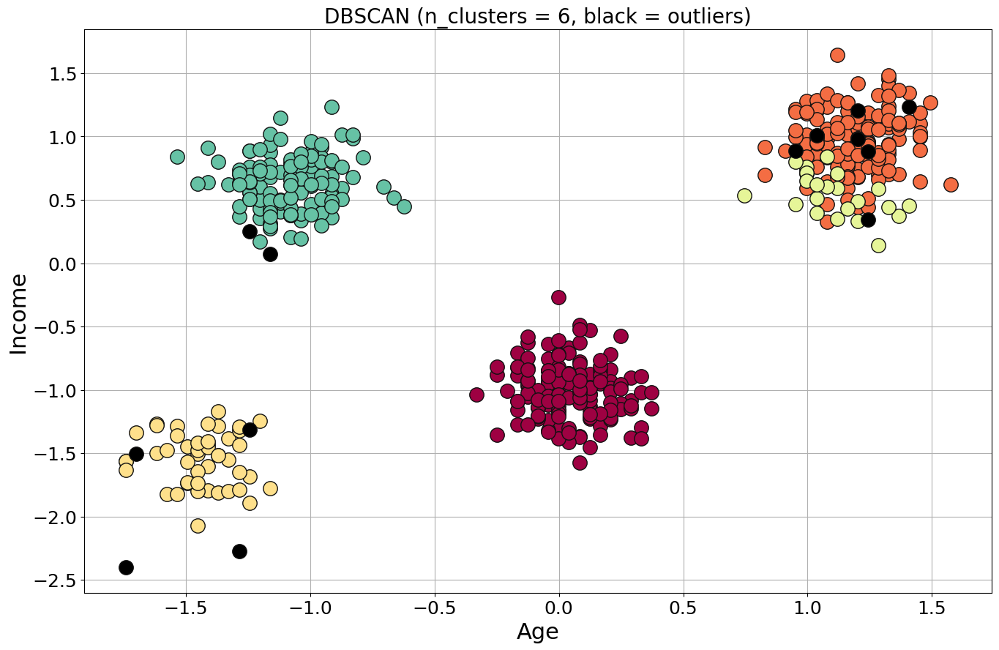

In [49]:
plt.figure(figsize=(16, 10));
plt.grid(True);

unique_labels = set(db.labels_)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

for k in unique_labels:
    if k == -1:        # Black used for noise.
        col = [0, 0, 0, 1]
    else:
        col = colors[k]

    xy = X[db.labels_ == k]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 3], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);

    
plt.title('');
plt.title("DBSCAN (n_clusters = {:d}, black = outliers)".format(len(unique_labels)), fontsize=20);
plt.xlabel('Age', fontsize=22);
plt.ylabel('Income', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
#plt.savefig('out/mall-dbscan-03.png', transparent=False);

# DB Scan Elbow Method

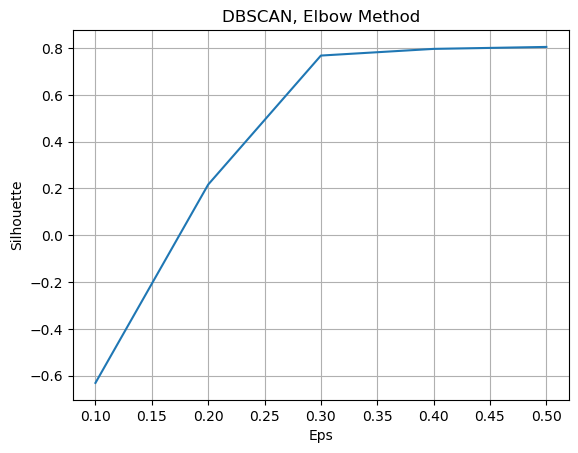

In [50]:
silhouettes = {}
for eps in np.arange(0.1, 0.6, 0.1):
    db = DBSCAN(eps=eps, min_samples=3).fit(X)
    silhouettes[eps] = silhouette_score(X, db.labels_, metric='euclidean')
    

plt.figure();
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('DBSCAN, Elbow Method')
plt.xlabel("Eps");
plt.ylabel("Silhouette");
plt.grid(True);
#plt.savefig('out/mall-dbscan-03-silhouette.png', transparent=False);

eps=0.1, min_samples=1, n_clusters=430, sil=0.07622070845434117
eps=0.1, min_samples=2, n_clusters=48, sil=-0.5282666637526231
eps=0.1, min_samples=3, n_clusters=15, sil=-0.6313739076946371
eps=0.1, min_samples=4, n_clusters=4, sil=-0.4590423145194752
eps=0.1, min_samples=5, n_clusters=3, sil=-0.17554431615393226
eps=0.1, min_samples=6, n_clusters=2, sil=-0.17493225898474807
eps=0.1, min_samples=7, n_clusters <= 1. Returning.
eps=0.1, min_samples=8, n_clusters <= 1. Returning.
eps=0.1, min_samples=9, n_clusters <= 1. Returning.
eps=0.2, min_samples=1, n_clusters=85, sil=-0.15312504415260236
eps=0.2, min_samples=2, n_clusters=18, sil=0.039297973719939226
eps=0.2, min_samples=3, n_clusters=12, sil=0.21650895666875325
eps=0.2, min_samples=4, n_clusters=9, sil=0.29103834394984224
eps=0.2, min_samples=5, n_clusters=7, sil=0.37355056274945037
eps=0.2, min_samples=6, n_clusters=6, sil=0.33843571870862393
eps=0.2, min_samples=7, n_clusters=5, sil=0.30897875484400195
eps=0.2, min_samples=8, n_c

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

eps=0.4, min_samples=1, n_clusters=8, sil=0.6221588649107799
eps=0.4, min_samples=2, n_clusters=6, sil=0.7965062016314277
eps=0.4, min_samples=3, n_clusters=6, sil=0.7965062016314277
eps=0.4, min_samples=4, n_clusters=6, sil=0.7965062016314277


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

eps=0.4, min_samples=5, n_clusters=6, sil=0.7965062016314277
eps=0.4, min_samples=6, n_clusters=6, sil=0.7965062016314277
eps=0.4, min_samples=7, n_clusters=6, sil=0.7965062016314277
eps=0.4, min_samples=8, n_clusters=6, sil=0.7965062016314277


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

eps=0.4, min_samples=9, n_clusters=6, sil=0.7965062016314277
eps=0.5, min_samples=1, n_clusters=5, sil=0.8048976287755765
eps=0.5, min_samples=2, n_clusters=5, sil=0.8048976287755765
eps=0.5, min_samples=3, n_clusters=5, sil=0.8048976287755765


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

eps=0.5, min_samples=4, n_clusters=5, sil=0.8048976287755765
eps=0.5, min_samples=5, n_clusters=5, sil=0.8048976287755765
eps=0.5, min_samples=6, n_clusters=5, sil=0.8048976287755765
eps=0.5, min_samples=7, n_clusters=5, sil=0.8048976287755765


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

eps=0.5, min_samples=8, n_clusters=5, sil=0.8048976287755765
eps=0.5, min_samples=9, n_clusters=5, sil=0.8048976287755765
eps=0.6, min_samples=1, n_clusters=5, sil=0.8048976287755765
eps=0.6, min_samples=2, n_clusters=5, sil=0.8048976287755765

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.


eps=0.6, min_samples=3, n_clusters=5, sil=0.8048976287755765
eps=0.6, min_samples=4, n_clusters=5, sil=0.8048976287755765


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

eps=0.6, min_samples=5, n_clusters=5, sil=0.8048976287755765
eps=0.6, min_samples=6, n_clusters=5, sil=0.8048976287755765
eps=0.6, min_samples=7, n_clusters=5, sil=0.8048976287755765
eps=0.6, min_samples=8, n_clusters=5, sil=0.8048976287755765

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.


eps=0.6, min_samples=9, n_clusters=5, sil=0.8048976287755765


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


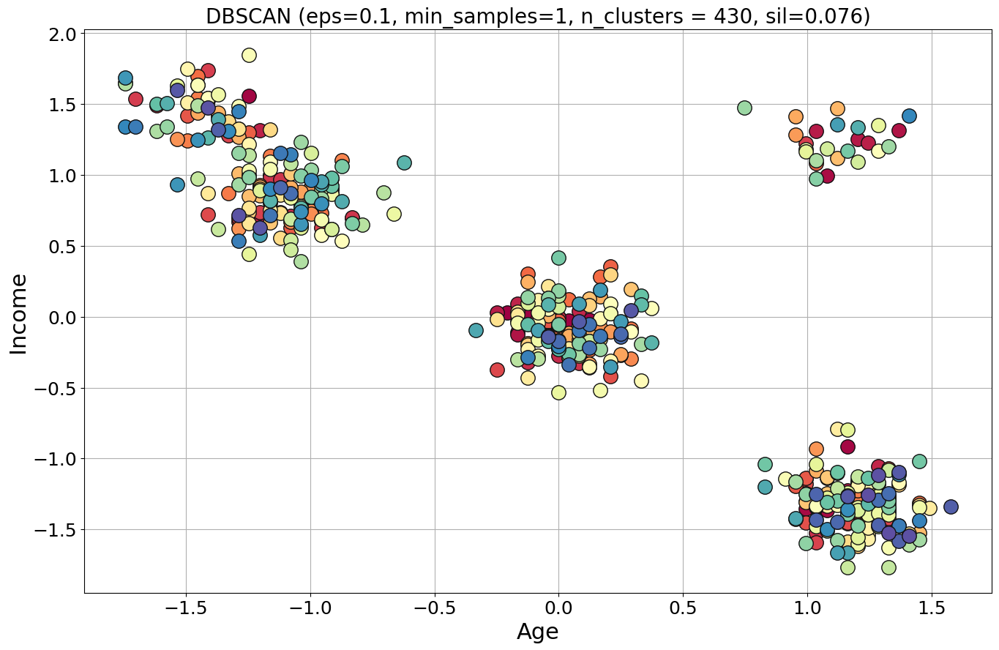

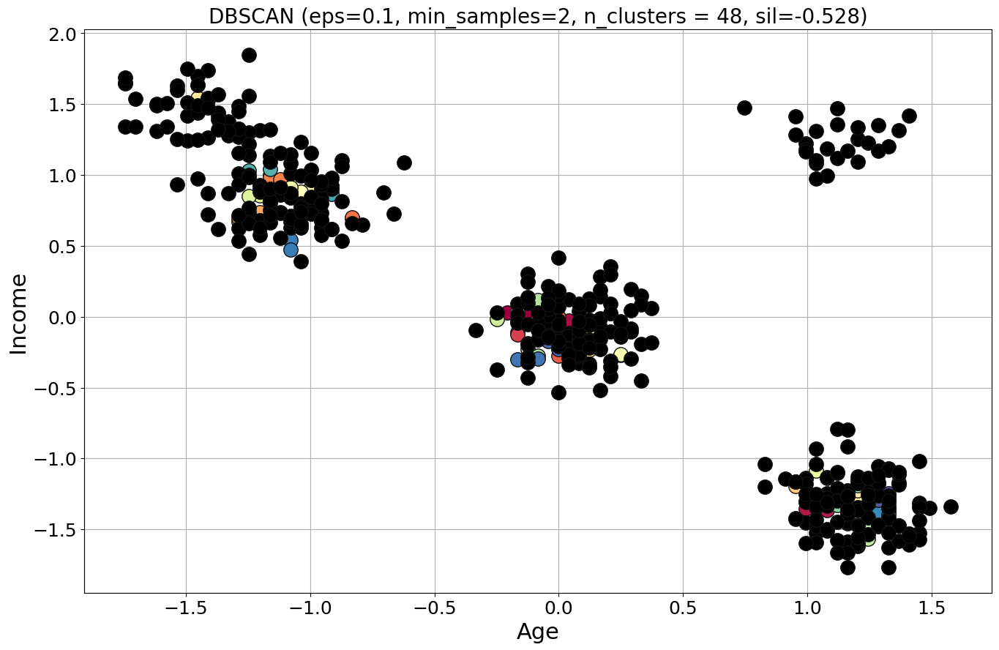

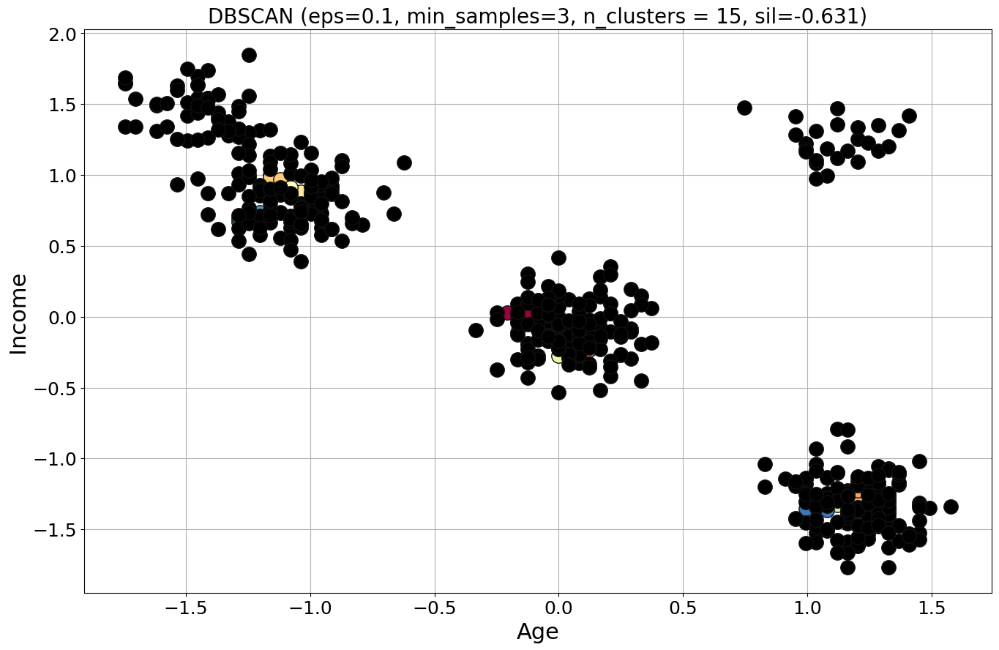

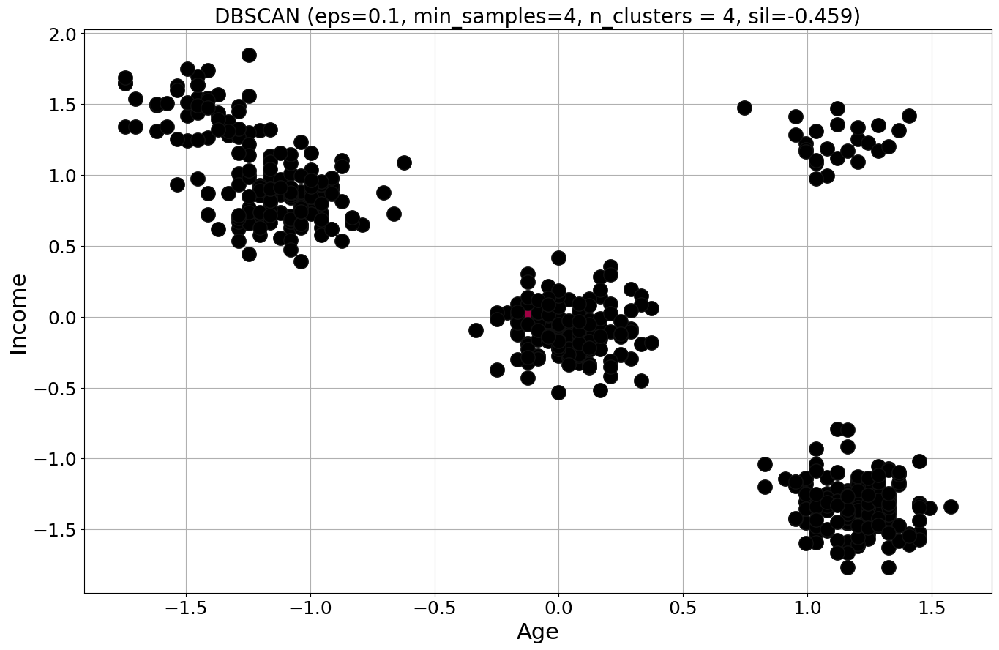

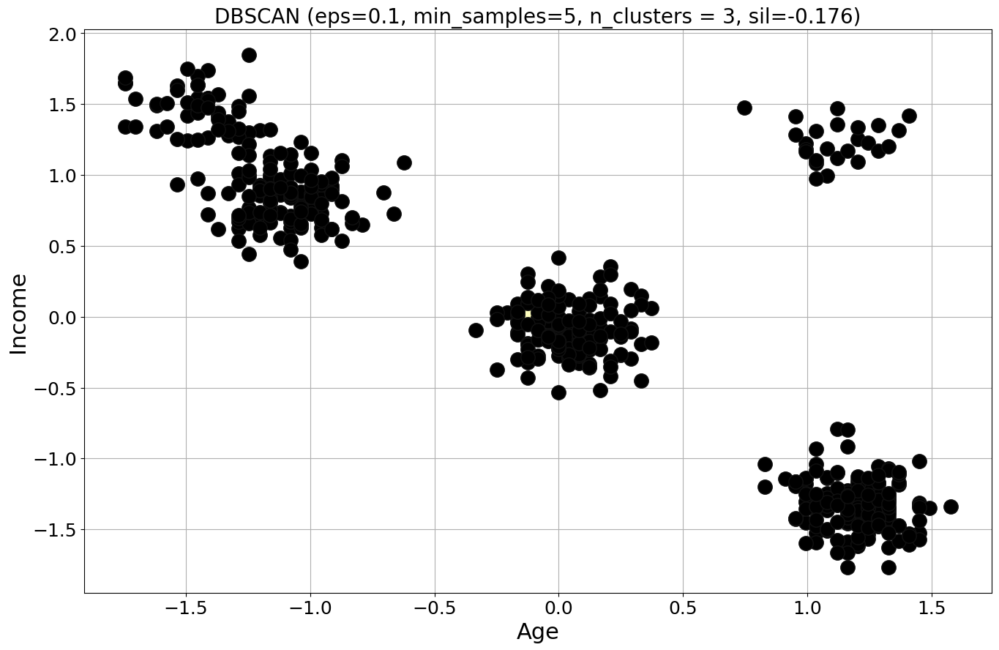

...

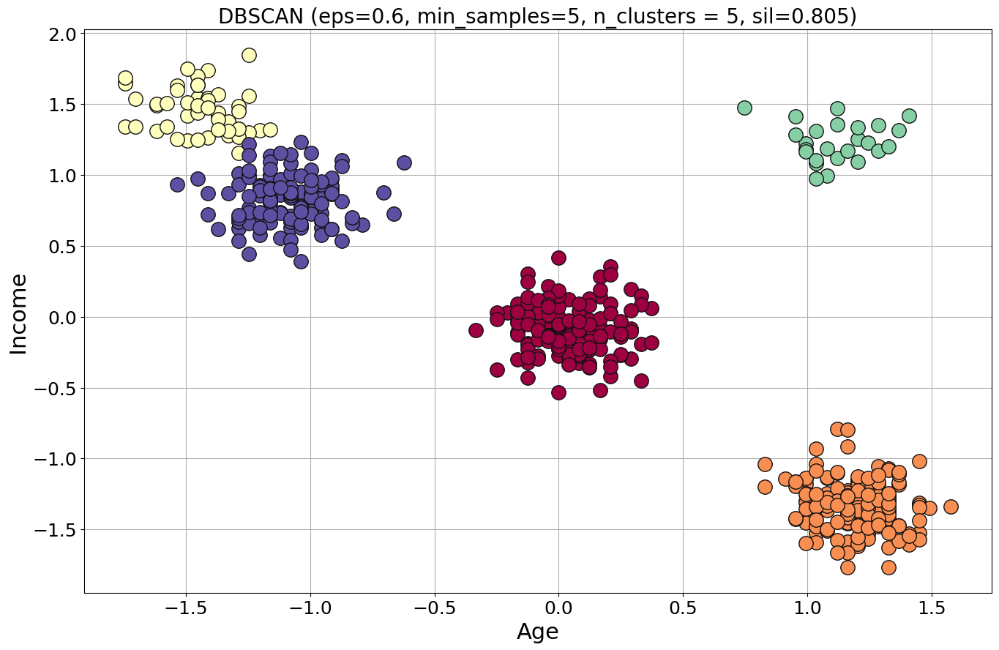

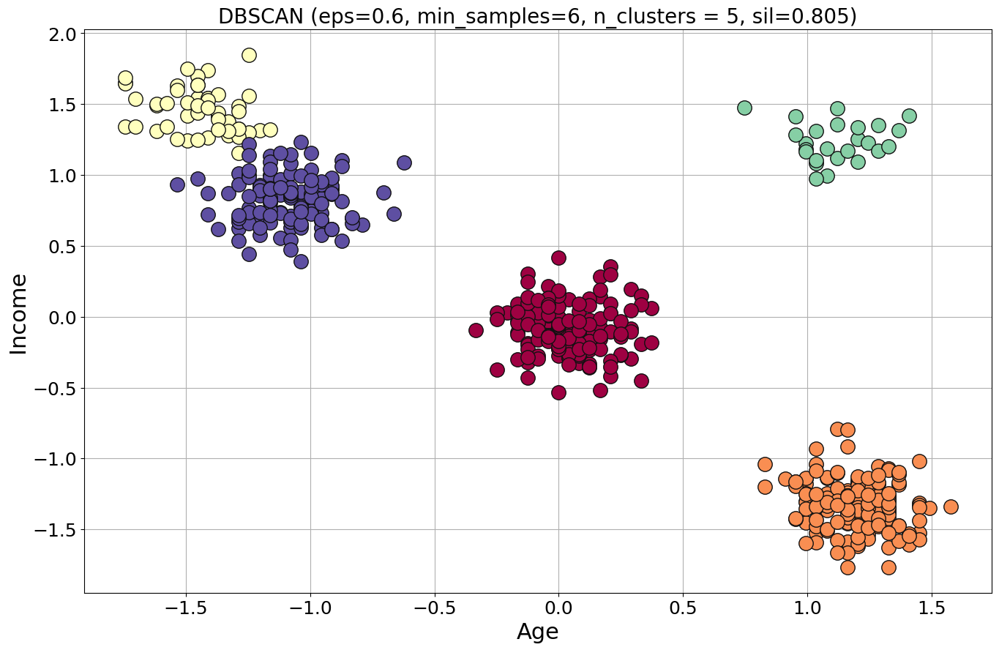

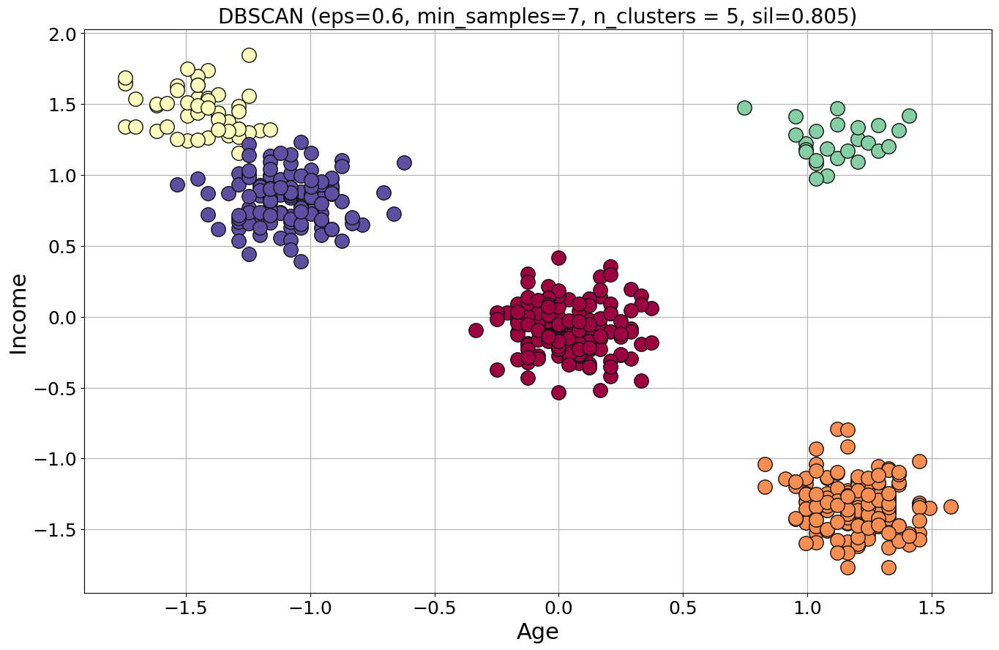

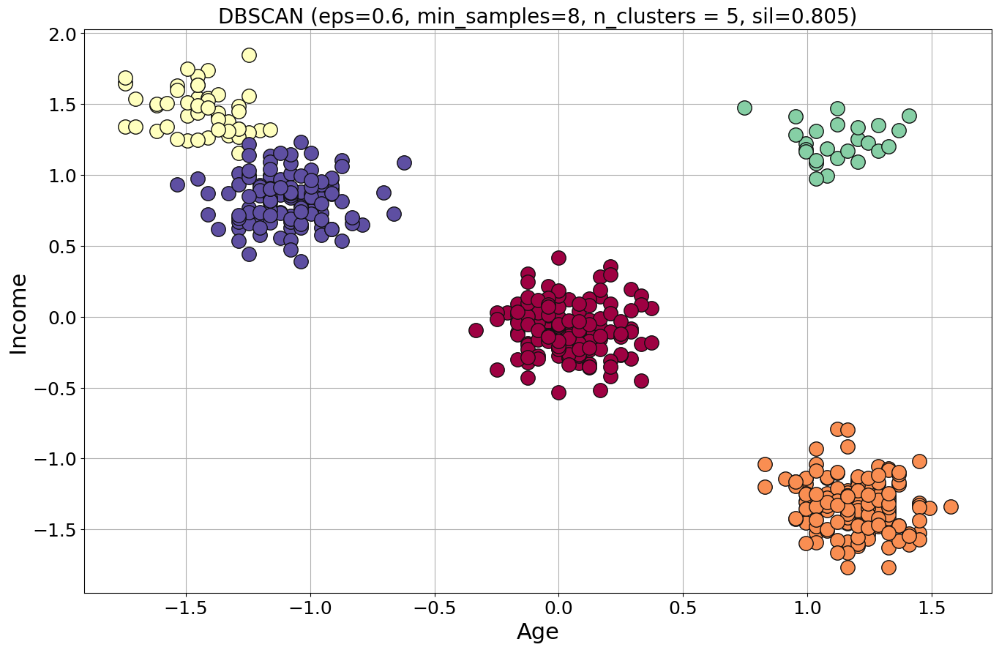

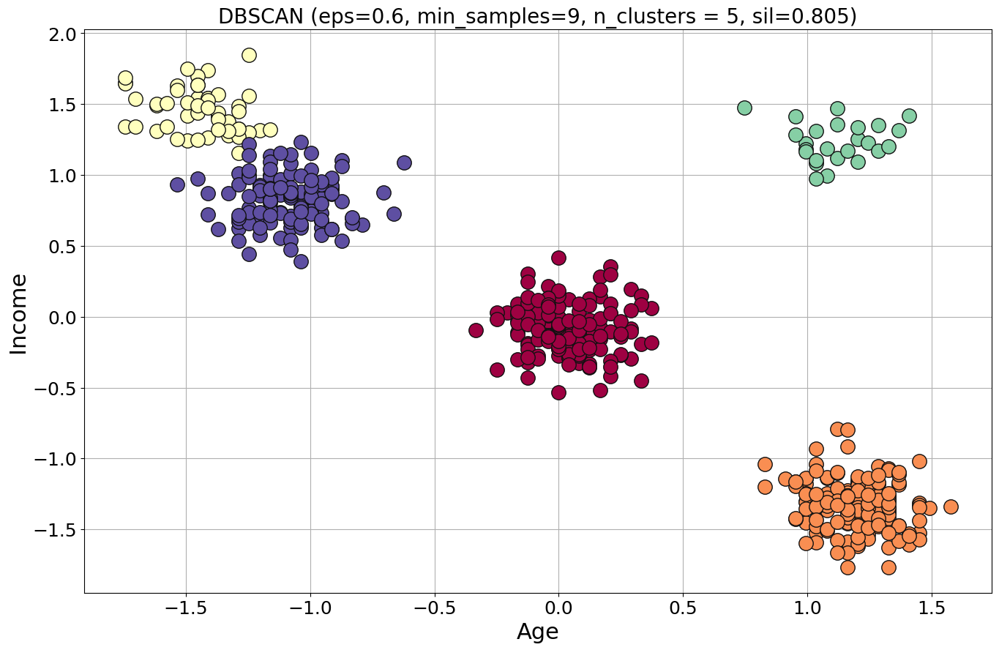

In [51]:
def do_dbscan(X, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)

    unique_labels = set(db.labels_)
    n_clusters = len(unique_labels)
    
    if n_clusters <= 1:
        print('eps={}, min_samples={}, n_clusters <= 1. Returning.'.format(eps, min_samples))
        return
    
    sil = silhouette_score(X, db.labels_)
    print("eps={}, min_samples={}, n_clusters={}, sil={}".format(eps, min_samples, n_clusters, sil))
    
    plt.figure(figsize=(16, 10));
    plt.grid(True);   
    
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

    for k in unique_labels:
        if k == -1:        # Black used for noise.
            col = [0, 0, 0, 1]
        else:
            col = colors[k]

        xy = X[db.labels_ == k]
        plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);


    plt.title('');
    plt.title("DBSCAN (eps={}, min_samples={}, n_clusters = {:d}, sil={:.3f})".format(eps, min_samples, n_clusters, sil), fontsize=20);
    plt.xlabel('Age', fontsize=22);
    plt.ylabel('Income', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    #plt.savefig('out/mall-dbscan-auto-{}-{}.png'.format(eps, min_samples), transparent=False);
    

epss = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
min_samples = range(1, 10)

for prod in list(itertools.product(epss, min_samples)):
    do_dbscan(X, prod[0], prod[1])